# Documentation of self learning and basic programming for AI training in python

In [1]:
# GPU verification
import torch
print("CUDA available:", torch.cuda.is_available())         # Examine availability of CUDA

# Tensor operations on GPU
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")  # Print the name of the GPU
    print(f"VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")  # Print the total VRAM

CUDA available: False


In [10]:
# Basic imports
import os, sys
import torch
import numpy as np
import matplotlib.pyplot as plt
import json, pickle
from pathlib import Path
import scipy.signal as scipy_signal
from captum.attr import IntegratedGradients
import shap

In [11]:
# Installation of required libraries for model interpretability and data visualization
#!pip install -q captum shap lime                # Captum is a model interpretability library for PyTorch
#!pip install -q matplotlib seaborn mne

In [12]:
# Environment configuration
IN_COLAB = 'google.colab' in sys.modules

# Change direction of current computer (1 for PC, 2 for laptop)
current_dir = 2
PC_DESIGN = "C:/Users/diseñoeinnovacion/Documents/MariaAndrade"
LAPTOP = "C:/Users/ferch/Documents/Various/EngineeringDesignAndInnovation/hybrid-ai-epilepsy-diagnosis"
REPO = "/prior-work/phase-vi-2025-sanchez/sanchez_repository"
CURRENT = PC_DESIGN if current_dir==1 else LAPTOP

if IN_COLAB:
    # === GOOGLE COLAB ===
    from google.colab import drive
    drive.mount('/content/drive')
    # !git clone https://github.com/sansancas/TesisFinal.git  
    REPO_ROOT  = '/content/TesisFinal'
    SAVE_DIR   = '/content/drive/MyDrive/XAI_Tesis_Results'
    TUSZ_ROOT  = '/content/drive/MyDrive/tusz'   

else:
    # === VISUAL STUDIO LOCAL ===
    REPO_ROOT  = f'{CURRENT}{REPO}'           
    SAVE_DIR   = f'{REPO_ROOT}/results'
    TUSZ_ROOT  = f'{CURRENT}/tusz'                  
    
MODEL_PATH = f'{REPO_ROOT}/api/networks/pt/model_final.pt'
CONFIG_PATH = f'{REPO_ROOT}/api/networks/pt/config_used.json'
SCALER_PATH = f'{REPO_ROOT}/api/networks/pt/feature_scaler.pkl'

# Add paths
sys.path.insert(0, REPO_ROOT)
sys.path.insert(0, f'{REPO_ROOT}/pt')

os.makedirs(SAVE_DIR, exist_ok=True)
print(f"Environment: {'Google Colab' if IN_COLAB else 'Local (VS Code)'}")
print(f"SAVE_DIR: {SAVE_DIR}")

Environment: Local (VS Code)
SAVE_DIR: C:/Users/ferch/Documents/Various/EngineeringDesignAndInnovation/hybrid-ai-epilepsy-diagnosis/prior-work/phase-vi-2025-sanchez/sanchez_repository/results


In [13]:
# Custom imports
from utils import load_config, validate_config
from pt.pipeline import make_model, _transformer_params_from_config
from api.processing.network_eval import (
    _load_bipolar_signals,
    _iter_windows,
    _compute_feature_vector,
)

### Model settings

In [74]:
# ── BLOQUE 4: Funciones auxiliares ───────────────────────────────────────────

def apply_filters(signals_np, fs):
    """
    Bandpass 0.5-40 Hz + notch 60 Hz.
    Mismo preprocesamiento que el pipeline de entrenamiento.
    signals_np: (total_samples, n_channels)
    """
    b_bp, a_bp = scipy_signal.butter(
        4, [0.5 / (fs / 2), 40.0 / (fs / 2)], btype='band'
    )
    b_notch, a_notch = scipy_signal.iirnotch(60.0, Q=30, fs=fs)
    filtered = signals_np.copy()
    for ch in range(signals_np.shape[1]):
        filtered[:, ch] = scipy_signal.filtfilt(b_bp,    a_bp,    filtered[:, ch])
        filtered[:, ch] = scipy_signal.filtfilt(b_notch, a_notch, filtered[:, ch])
    return filtered


def parse_csv_bi(csv_bi_path):
    """
    Lee .csv_bi de TUSZ v1.0.0 y retorna intervalos (t_start, t_end) de crisis.
    Formato: channel,start_time,stop_time,label,confidence
    Solo incluye filas con label='seiz'.
    """
    seizure_intervals = []
    
    with open(csv_bi_path, 'r', encoding='utf-8', errors='ignore') as f:
        lines = f.readlines()
    
    # Encontrar línea de encabezado
    header_idx = None
    for i, line in enumerate(lines):
        if line.strip().startswith('channel,'):
            header_idx = i
            break
    
    if header_idx is None:
        return []
    
    # Leer índices de columnas desde el encabezado
    header    = lines[header_idx].strip().split(',')
    idx_start = header.index('start_time')   # 1
    idx_stop  = header.index('stop_time')    # 2
    idx_label = header.index('label')        # 3
    
    # Leer filas de datos
    for line in lines[header_idx + 1:]:
        line = line.strip()
        if not line or line.startswith('#'):
            continue
        parts = line.split(',')
        if len(parts) <= max(idx_start, idx_stop, idx_label):
            continue
        label = parts[idx_label].strip().lower()
        if 'seiz' in label:
            try:
                seizure_intervals.append(
                    (float(parts[idx_start]), float(parts[idx_stop]))
                )
            except ValueError:
                continue
    
    return seizure_intervals


def label_window(t_start, t_end, seizure_intervals, min_overlap_sec=1.0):
    """
    Etiqueta ventana como ictal (1) si overlapa >= min_overlap_sec
    con algún intervalo de crisis. Fondo (0) en caso contrario.
    """
    for s_start, s_end in seizure_intervals:
        overlap = max(0.0, min(t_end, s_end) - max(t_start, s_start))
        if overlap >= min_overlap_sec:
            return 1
    return 0


def _get_prob(model_output):
    """
    Extrae tensor de probabilidades del output del modelo.
    Maneja namedtuple (.probabilities), tuple, o tensor directo.
    """
    if hasattr(model_output, 'probabilities'):
        return model_output.probabilities
    if isinstance(model_output, tuple):
        return model_output[0]


def _verify_model_output(model, x_signal, x_feat, n_show=5):
    """
    Verifica salida del modelo y muestra probabilidades.
    """
    with torch.no_grad():
        out = model(x_signal[:n_show], x_feat[:n_show])

    probs = _get_prob(out)

    # Convertir a numpy siempre
    if isinstance(probs, torch.Tensor):
        probs = probs.detach().cpu().numpy()

    probs = np.asarray(probs)

    print(f"Tipo de salida: {type(out).__name__}")
    print(f"Shape probs: {probs.shape}")
    print(f"Probabilidades ({n_show}): {np.round(probs, 3)}")

    return probs


def select_top(indices, probs, n, highest=True):
    indices = np.array(indices).flatten()
    if len(indices) == 0:
        return np.array([], dtype=int)
    n = min(n, len(indices))
    sorted_idx = indices[np.argsort(probs[indices])]
    result = sorted_idx[::-1][:n] if highest else sorted_idx[:n]
    return result.copy()

def make_group_tensors(indices, X_signal, X_feat):
    """
    Retorna tensores seleccionados para un grupo.
    Retorna (None, None) si el grupo está vacío.
    .copy() resuelve el problema de strides negativos
    que genera numpy al invertir arrays con [::-1]
    """
    if len(indices) == 0:
        return None, None
    # .copy() crea un array contiguo en memoria sin strides negativos
    indices_clean = np.array(indices).copy()
    return X_signal[indices_clean], X_feat[indices_clean]

In [65]:
# ── Model variables ───────────────────────────────

CHANNEL_NAMES = [
    'FP1-F7','F7-T3','T3-T5','T5-O1',
    'FP2-F8','F8-T4','T4-T6','T6-O2',
    'A1-T3', 'T3-C3','C3-CZ','CZ-C4',
    'C4-T4', 'T4-A2','FP1-F3','F3-C3',
    'C3-P3', 'P3-O1','FP2-F4','F4-C4',
    'C4-P4', 'P4-O2'
]

config_obj = load_config(CONFIG_PATH)       # Get and converts into PipelineConfig
config_obj = validate_config(config_obj)    # Validation of all necessary parameters
transformer_params = _transformer_params_from_config(config_obj)

with open(CONFIG_PATH) as f:
    config = json.load(f)

FS       = int(config['target_fs'])             # 256
WIN_SEC  = float(config['window_sec'])          # 10.0
HOP_SEC  = float(config['hop_sec'])             # 5.0
N_SAMPLES = int(FS * WIN_SEC)                   # 2560 
FEATURE_NAMES = config['selected_features']     # Names
N_FEATURES = len(FEATURE_NAMES)                 # 16
MODEL_TYPE = config['model']                    # 'transformer'

N_CHANNELS = config.get('n_channels', 22)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

with open(SCALER_PATH, 'rb') as f:
    scaler = pickle.load(f)

print(f"FS: {FS} | WIN_SEC: {WIN_SEC} | N_SAMPLES: {N_SAMPLES}")
print(f"Features: {N_FEATURES} | Channels: {N_CHANNELS}")
print(f"Device: {DEVICE}")

# ── Select EDFs with crisis ───────────────────────────────
# TUSZ saves annotations in .tse files alongside each .edf
# A file has a seizure if it contains the word 'seiz'

tusz_eval = Path(TUSZ_ROOT)
edf_con_crisis = []

for edf_path in tusz_eval.rglob('*.edf'):
    tse_path = edf_path.with_suffix('.csv_bi')
    if tse_path.exists() and 'seiz' in tse_path.read_text(encoding='utf-8', errors='ignore').lower():
        edf_con_crisis.append(edf_path)

print(f"EDFs with crisis found: {len(edf_con_crisis)}")

FS: 256 | WIN_SEC: 10.0 | N_SAMPLES: 2560
Features: 16 | Channels: 22
Device: cpu
EDFs with crisis found: 9


c:\Users\ferch\Documents\Various\EngineeringDesignAndInnovation\hybrid-ai-epilepsy-diagnosis\.venv\Lib\site-packages\sklearn\base.py:463: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.7.1 when using version 1.8.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


### Model

In [66]:
# ── Get and set final model ───────────────────────────────

real_model = make_model(
    model_type=config_obj.model,
    input_shape=(N_SAMPLES, N_CHANNELS),
    feat_dim=N_FEATURES,
    num_filters=config_obj.num_filters,
    kernel_size=config_obj.kernel_size,
    dropout_rate=config_obj.dropout,
    rnn_units=config_obj.rnn_units,
    time_step=config_obj.time_step_labels,
    transformer_params=transformer_params
).to(DEVICE)

checkpoint = torch.load(MODEL_PATH, map_location=DEVICE)
state_dict = checkpoint.get("state_dict", checkpoint)

real_model.load_state_dict(state_dict)
real_model.eval()

TransformerClassifier(
  (conv1): SeparableConv1d(
    (depthwise): Conv1d(22, 22, kernel_size=(7,), stride=(2,), padding=(3,), groups=22, bias=False)
    (pointwise): Conv1d(22, 64, kernel_size=(1,), stride=(1,), bias=False)
  )
  (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): SeparableConv1d(
    (depthwise): Conv1d(64, 64, kernel_size=(7,), stride=(2,), padding=(3,), groups=64, bias=False)
    (pointwise): Conv1d(64, 128, kernel_size=(1,), stride=(1,), bias=False)
  )
  (bn2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (proj): Linear(in_features=128, out_features=128, bias=True)
  (proj_dropout): Dropout(p=0.1, inplace=False)
  (cls_token): AddCLSToken()
  (initial_film): FiLM1d(
    (g): Linear(in_features=16, out_features=128, bias=True)
    (b): Linear(in_features=16, out_features=128, bias=True)
  )
  (blocks): ModuleList(
    (0-3): 4 x TransformerBlock(
      (attn): MultiHeadSelfAttenti

### Window generation

In [67]:
# ── BLOQUE 8: Generación de ventanas con etiquetas ───────────────────────────
N_EDFS = 5

all_windows  = []
all_features = []
all_labels   = []
all_times    = []
all_paths    = []

for edf_path in edf_con_crisis[:N_EDFS]:
    print(f"\nProcesando: {edf_path.name}")

    csv_bi_path = edf_path.with_suffix('.csv_bi')
    if not csv_bi_path.exists():
        print("  ⚠ Sin anotaciones: saltando")
        continue

    seizure_intervals = parse_csv_bi(csv_bi_path)
    print(f"  Intervalos de crisis: {len(seizure_intervals)}")

    try:
        signals, fs = _load_bipolar_signals(
            edf_path,
            montage=config['montage'],
            target_fs=float(config['target_fs'])
        )
    except Exception as e:
        print(f"  ⚠ Error leyendo EDF: {e}")
        continue

    # Filtros del pipeline de entrenamiento — antes de segmentar
    signals = apply_filters(signals, fs)
    print(f"  Señal: {signals.shape} @ {fs}Hz")

    n_ictal = 0
    n_bckg  = 0

    for window, t_start, t_end in _iter_windows(
        signals,
        fs=fs,
        window_sec=WIN_SEC,
        hop_sec=HOP_SEC,
        window_samples=N_SAMPLES,
        hop_samples=int(HOP_SEC * fs)
    ):
        label    = label_window(t_start, t_end, seizure_intervals)
        feat_dict = _compute_feature_vector(window, fs=fs)
        feat_row  = [float(feat_dict.get(name, 0.0)) for name in FEATURE_NAMES]

        all_windows.append(window)
        all_features.append(feat_row)
        all_labels.append(label)
        all_times.append((t_start, t_end))
        all_paths.append(edf_path.name)

        if label == 1: n_ictal += 1
        else:          n_bckg  += 1

    print(f"  {n_ictal} ictales | {n_bckg} fondo")

print(f"\nTotal: {len(all_windows)} ventanas | "
      f"Ictales: {sum(all_labels)} | Fondo: {len(all_labels)-sum(all_labels)}")

if sum(all_labels) == 0:
    raise ValueError("Sin ventanas ictales. Verificar archivos .csv_bi")


Procesando: aaaaaajy_s001_t000.edf
  Intervalos de crisis: 7
  Señal: (448000, 22) @ 256.0Hz
  257 ictales | 92 fondo

Procesando: aaaaaajy_s002_t002.edf
  Intervalos de crisis: 2
  Señal: (69632, 22) @ 256.0Hz
  31 ictales | 22 fondo

Procesando: aaaaaajy_s003_t000.edf
  Intervalos de crisis: 2
  Señal: (59904, 22) @ 256.0Hz
  43 ictales | 2 fondo

Procesando: aaaaaajy_s003_t001.edf
  Intervalos de crisis: 2
  Señal: (57344, 22) @ 256.0Hz
  35 ictales | 8 fondo

Procesando: aaaaaajy_s003_t002.edf
  Intervalos de crisis: 2
  Señal: (51968, 22) @ 256.0Hz
  31 ictales | 8 fondo

Total: 529 ventanas | Ictales: 397 | Fondo: 132


### Conversion, selection and save data

In [68]:
# ── BLOQUE 9: Conversión, selección y guardado de estado ─────────────────────
assert len(all_windows) > 0 and scaler is not None

labels_np       = np.array(all_labels,   dtype=np.int8)
windows_np      = np.array(all_windows,  dtype=np.float32)   # (N, 2560, 22)
features_np     = np.array(all_features, dtype=np.float32)   # (N, 16)
features_scaled = scaler.transform(features_np)               # (N, 16)

X_signal = torch.tensor(windows_np,      dtype=torch.float32).to(DEVICE)
X_feat   = torch.tensor(features_scaled, dtype=torch.float32).to(DEVICE)

# Probabilidades para todas las ventanas en batches
print("Calculando probabilidades para todas las ventanas...")
BATCH_SIZE = 32
all_probs_list = []
with torch.no_grad():
    for i in range(0, len(X_signal), BATCH_SIZE):
        out   = real_model(X_signal[i:i+BATCH_SIZE], X_feat[i:i+BATCH_SIZE])
        probs = _get_prob(out).squeeze(-1).cpu().numpy()
        all_probs_list.append(probs)
all_probs = np.concatenate(all_probs_list)

print(f"Probs: min={all_probs.min():.3f} | max={all_probs.max():.3f} | "
      f"mean={all_probs.mean():.3f}")

# Clasificar por threshold
THRESHOLD   = 0.5
pred_labels = (all_probs >= THRESHOLD).astype(np.int8)

tp_idx = np.where((labels_np == 1) & (pred_labels == 1))[0]
fp_idx = np.where((labels_np == 0) & (pred_labels == 1))[0]
tn_idx = np.where((labels_np == 0) & (pred_labels == 0))[0]
fn_idx = np.where((labels_np == 1) & (pred_labels == 0))[0]

print(f"\nMatriz de confusión (threshold={THRESHOLD}):")
print(f"  TP={len(tp_idx)} | FP={len(fp_idx)} | "
      f"TN={len(tn_idx)} | FN={len(fn_idx)}")

# Seleccionar representantes de cada grupo
N_POR_GRUPO = 3
sel_tp = select_top(tp_idx, all_probs, N_POR_GRUPO, highest=True)
sel_fp = select_top(fp_idx, all_probs, N_POR_GRUPO, highest=True)
sel_tn = select_top(tn_idx, all_probs, N_POR_GRUPO, highest=False)
sel_fn = select_top(fn_idx, all_probs, N_POR_GRUPO, highest=False)

print(f"Seleccionados para XAI: "
      f"TP={len(sel_tp)} | FP={len(sel_fp)} | "
      f"TN={len(sel_tn)} | FN={len(sel_fn)}")

# Guardar estado completo antes de XAI
state = {
    'labels':      labels_np.tolist(),
    'all_probs':   all_probs.tolist(),
    'pred_labels': pred_labels.tolist(),
    'all_times':   all_times,
    'all_paths':   all_paths,
    'sel_tp': sel_tp.tolist(), 'sel_fp': sel_fp.tolist(),
    'sel_tn': sel_tn.tolist(), 'sel_fn': sel_fn.tolist(),
    'threshold': THRESHOLD,
    'n_windows': len(all_windows),
}
with open(f'{SAVE_DIR}/xai_state.json', 'w') as f:
    json.dump(state, f, indent=2)

np.save(f'{SAVE_DIR}/windows_np.npy',      windows_np)
np.save(f'{SAVE_DIR}/features_scaled.npy', features_scaled)
np.save(f'{SAVE_DIR}/labels_np.npy',       labels_np)
np.save(f'{SAVE_DIR}/all_probs.npy',       all_probs)

print(f"✓ Estado guardado en {SAVE_DIR}")

Calculando probabilidades para todas las ventanas...
Probs: min=0.000 | max=0.992 | mean=0.030

Matriz de confusión (threshold=0.5):
  TP=4367 | FP=1452 | TN=68376 | FN=205646
Seleccionados para XAI: TP=3 | FP=3 | TN=3 | FN=3
✓ Estado guardado en C:/Users/ferch/Documents/Various/EngineeringDesignAndInnovation/hybrid-ai-epilepsy-diagnosis/prior-work/phase-vi-2025-sanchez/sanchez_repository/results


In [71]:
print(f"X_signal shape: {X_signal.shape}")
print(f"X_feat shape:   {X_feat.shape}")
print(f"windows_np shape: {windows_np.shape}")

X_signal shape: torch.Size([529, 2560, 22])
X_feat shape:   torch.Size([529, 16])
windows_np shape: (529, 2560, 22)


### Verification

In [72]:
print(f"X_tp shape: {X_tp.shape if X_tp is not None else 'None'}")
print(f"X_ref shape: {X_ref.shape}")
print(f"X_ref.dim(): {X_ref.dim()}")
print(f"sel_tp: {sel_tp}")
print(f"sel_tp shape: {sel_tp.shape}")

X_tp shape: torch.Size([3, 1, 2560, 22])
X_ref shape: torch.Size([3, 1, 2560, 22])
X_ref.dim(): 4
sel_tp: [[352]
 [352]
 [352]]
sel_tp shape: (3, 1)


In [75]:
def make_group_tensors(sel, X_signal, X_feat):
    """
    Convierte índices a vector 1D y extrae tensores con forma correcta.

    Retorna:
        X_sel   -> (B, T, C)
        feat_sel -> (B, F)
    """
    if sel is None:
        return None, None

    sel = np.asarray(sel).reshape(-1)

    if len(sel) == 0:
        return None, None

    X_sel = X_signal[sel]
    feat_sel = X_feat[sel]

    # Si quedó dimensión extra: (B,1,T,C) -> (B,T,C)
    if X_sel.dim() == 4 and X_sel.shape[1] == 1:
        X_sel = X_sel.squeeze(1)

    return X_sel, feat_sel


def prepare_reference_tensor(X_tp, feat_tp, X_fp, feat_fp):
    """
    Selecciona TP como referencia; si no existe usa FP.
    """
    if X_tp is not None:
        return X_tp, feat_tp
    elif X_fp is not None:
        return X_fp, feat_fp
    else:
        raise ValueError("No hay tensores TP ni FP disponibles.")


# ==================================================
# BLOQUE CORREGIDO
# ==================================================

X_tp, feat_tp = make_group_tensors(sel_tp, X_signal, X_feat)
X_fp, feat_fp = make_group_tensors(sel_fp, X_signal, X_feat)
X_tn, feat_tn = make_group_tensors(sel_tn, X_signal, X_feat)
X_fn, feat_fn = make_group_tensors(sel_fn, X_signal, X_feat)

X_ref, feat_ref = prepare_reference_tensor(
    X_tp, feat_tp,
    X_fp, feat_fp
)

print("PASO 0: Verificando modelo...")
print("X_ref shape:", X_ref.shape)
print("feat_ref shape:", feat_ref.shape)

_verify_model_output(real_model, X_ref, feat_ref)

PASO 0: Verificando modelo...
X_ref shape: torch.Size([3, 2560, 22])
feat_ref shape: torch.Size([3, 16])
Tipo de salida: TransformerOutputs
Shape probs: (3, 1, 1)
Probabilidades (5): [[[0.69]]

 [[0.69]]

 [[0.69]]]


array([[[0.69022363]],

       [[0.6902235 ]],

       [[0.6902236 ]]], dtype=float32)

### XAI Methods

In [84]:
# ── BLOQUE 11: Funciones XAI ──────────────────────────────────────────────────

# ── 11a: Saliency ────────────────────────────────────────────────────────────

def compute_saliency_signal(model, x_signal, x_feat):
    """
    |∂P/∂señal| — importancia de cada punto temporal de cada canal.
    Retorna: (batch, time, channels)
    """
    model.eval()
    x    = x_signal.clone().detach().requires_grad_(True)
    feat = x_feat.clone().detach()
    model.zero_grad()
    out  = model(x, feat)
    _get_prob(out).sum().backward()
    return x.grad.abs().detach().cpu().numpy()


def compute_ig_features(model, x_signal, x_feat, n_steps=50):
    """
    Integrated Gradients sobre features tabulares.
    """

    model.eval()
    device = next(model.parameters()).device

    x_signal = x_signal.to(device).float()
    x_feat   = x_feat.to(device).float()

    B = x_feat.shape[0]

    def forward(feat):
        # Captum expande feat: (B*n_steps, F)
        expanded_B = feat.shape[0]
        repeat_factor = expanded_B // B

        signal_rep = x_signal.repeat_interleave(repeat_factor, dim=0)

        prob = _get_prob(model(signal_rep, feat))

        if prob.dim() > 1 and prob.shape[-1] == 1:
            prob = prob.squeeze(-1)

        return prob

    ig = IntegratedGradients(forward)

    attrs, delta = ig.attribute(
        x_feat,
        baselines=torch.zeros_like(x_feat),
        n_steps=n_steps,
        return_convergence_delta=True
    )

    return attrs.detach().cpu().numpy()

# ── 11c: Occlusion ───────────────────────────────────────────────────────────
def compute_occlusion_signal(model, x_signal, x_feat):
    """
    Occlusion por canal.
    x_signal: (B,T,C)
    """

    model.eval()
    device = next(model.parameters()).device

    x_signal = x_signal.to(device).float()
    x_feat   = x_feat.to(device).float()

    B, T, C = x_signal.shape

    with torch.no_grad():
        base = _get_prob(model(x_signal, x_feat))
        if isinstance(base, torch.Tensor):
            base = base.detach().cpu().numpy()

    base = np.asarray(base).reshape(-1)   # <- clave

    drop = np.zeros((B, C), dtype=np.float32)

    for ch in range(C):
        x_m = x_signal.clone()
        x_m[:, :, ch] = 0.0

        with torch.no_grad():
            m = _get_prob(model(x_m, x_feat))
            if isinstance(m, torch.Tensor):
                m = m.detach().cpu().numpy()

        m = np.asarray(m).reshape(-1)     # <- clave

        drop[:, ch] = base - m

    return drop, base

def compute_occlusion_features(model, x_signal, x_feat):
    """
    Occlusion sobre features tabulares.
    Enmascara cada feature a cero y mide caída en P(ictal).

    Inputs:
        x_signal : (B, T, C)
        x_feat   : (B, F)

    Returns:
        drop : (B, F)
        base : (B,)
    """
    import numpy as np
    import torch

    model.eval()
    device = next(model.parameters()).device

    x_signal = x_signal.to(device).float()
    x_feat   = x_feat.to(device).float()

    n_batch, n_feat = x_feat.shape

    # Predicción base
    with torch.no_grad():
        base = _get_prob(model(x_signal, x_feat))

    if isinstance(base, torch.Tensor):
        base = base.detach().cpu().numpy()

    base = np.asarray(base).reshape(-1)   # siempre (B,)

    # Matriz de impacto
    drop = np.zeros((n_batch, n_feat), dtype=np.float32)

    # Occlusion feature por feature
    for i in range(n_feat):
        f_m = x_feat.clone()
        f_m[:, i] = 0.0

        with torch.no_grad():
            m = _get_prob(model(x_signal, f_m))

        if isinstance(m, torch.Tensor):
            m = m.detach().cpu().numpy()

        m = np.asarray(m).reshape(-1)     # siempre (B,)

        drop[:, i] = base - m

    return drop, base

# ── 11d: SHAP ────────────────────────────────────────────────────────────────
# ─────────────────────────────────────────────────────────────────────────────
# SHAP FEATURES (corregido para Transformer + FiLM)
# ─────────────────────────────────────────────────────────────────────────────

def compute_shap_features(model, x_signal, x_feat, background_feat, nsamples=100):
    """
    SHAP values para features tabulares.
    Señal EEG fija.

    Inputs:
        x_signal        : (B,T,C)
        x_feat          : (B,F)
        background_feat : (Nbg,F)

    Returns:
        shap_values : (B,F)
    """
    import numpy as np
    import torch
    import shap

    model.eval()
    device = next(model.parameters()).device

    x_signal = x_signal.to(device).float()
    x_feat   = x_feat.to(device).float()
    background_feat = background_feat.to(device).float()

    signal_fixed = x_signal[:1].clone()   # una sola señal base

    def forward_features(feat_np):
        feat_t = torch.tensor(feat_np, dtype=torch.float32, device=device)

        batch_size = feat_t.shape[0]

        sig = signal_fixed.expand(batch_size, -1, -1)

        with torch.no_grad():
            prob = _get_prob(model(sig, feat_t))

        if isinstance(prob, torch.Tensor):
            prob = prob.detach().cpu().numpy()

        prob = np.asarray(prob).reshape(-1)   # SIEMPRE (B,)

        return prob

    explainer = shap.KernelExplainer(
        forward_features,
        background_feat.detach().cpu().numpy()
    )

    shap_values = explainer.shap_values(
        x_feat.detach().cpu().numpy(),
        nsamples=nsamples
    )

    return np.asarray(shap_values)


# ─────────────────────────────────────────────────────────────────────────────
# ATTENTION EXTRACTION (más robusto)
# ─────────────────────────────────────────────────────────────────────────────

attention_store = {}

def _make_attention_hook(layer_name):
    def hook(module, inputs, output):
        try:
            if isinstance(output, tuple):
                for item in output:
                    if torch.is_tensor(item):
                        attention_store[layer_name] = item.detach().cpu()
                        return
            elif torch.is_tensor(output):
                attention_store[layer_name] = output.detach().cpu()
        except:
            pass
    return hook


def extract_attention_weights(model, x_signal, x_feat):
    """
    Captura activaciones de módulos attention.
    Retorna dict[layer_name] = tensor
    """
    import torch

    model.eval()
    device = next(model.parameters()).device

    x_signal = x_signal.to(device).float()
    x_feat   = x_feat.to(device).float()

    hooks = []
    attention_store.clear()

    for name, module in model.named_modules():
        lname = name.lower()

        if any(k in lname for k in ["attn", "attention", "mha"]):
            if "norm" not in lname:
                hooks.append(
                    module.register_forward_hook(
                        _make_attention_hook(name)
                    )
                )

    with torch.no_grad():
        _ = model(x_signal, x_feat)

    for h in hooks:
        h.remove()

    print("Capas capturadas:", list(attention_store.keys()))

    return dict(attention_store)

# ── 11f: Funciones de visualización ─────────────────────────────────────────

def plot_saliency_signal(saliency, x_signal_np, channel_names,
                          title, save_path=None):
    """
    Señal EEG con overlay rojo proporcional al saliency.
    saliency: (time, channels) — una sola ventana ya indexada
    x_signal_np: (time, channels)
    """
    n_t, n_ch = saliency.shape
    t_axis    = np.linspace(0, WIN_SEC, n_t)
    fig, axes = plt.subplots(n_ch, 1, figsize=(14, n_ch * 0.7), sharex=True)
    fig.suptitle(title, fontsize=10, fontweight='bold')
    sal_max = saliency.max() if saliency.max() > 0 else 1.0
    for i, ax in enumerate(axes):
        sal = saliency[:, i] / sal_max
        ax.plot(t_axis, x_signal_np[:, i], color='#444444', linewidth=0.6)
        for j in range(len(t_axis) - 1):
            ax.axvspan(t_axis[j], t_axis[j+1],
                       alpha=float(sal[j]) * 0.6, color='#E24B4A', linewidth=0)
        ax.set_ylabel(channel_names[i], fontsize=7, rotation=0,
                      labelpad=55, va='center')
        ax.set_yticks([])
        ax.spines[['top', 'right', 'left']].set_visible(False)
    axes[-1].set_xlabel('Time (s)', fontsize=10)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()


def plot_saliency_features(saliency_feat, feature_names, title, save_path=None):
    """
    Barras horizontales de importancia promedio de features.
    saliency_feat: (batch, 16)
    """
    mean_sal   = saliency_feat.mean(axis=0)
    sorted_idx = np.argsort(mean_sal)[::-1]
    fig, ax    = plt.subplots(figsize=(10, 6))
    ax.barh(
        [feature_names[i] for i in sorted_idx],
        mean_sal[sorted_idx],
        color=['#E24B4A' if mean_sal[i] > mean_sal.mean()
               else '#B5D4F4' for i in sorted_idx]
    )
    ax.set_xlabel('|∂P/∂feature| promedio', fontsize=10)
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.invert_yaxis()
    plt.tight_layout()
    if save_path: plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()


def plot_ig_signal(ig_attrs, channel_names, title, save_path=None):
    """
    Heatmap canales × bins. Rojo=pro-crisis, Azul=anti-crisis.
    ig_attrs: (batch, time, channels) — promediado sobre batch.
    """
    attr_mean   = ig_attrs.mean(axis=0)             # (2560, 22)
    n_bins      = 64
    attr_binned = attr_mean.reshape(n_bins, -1, attr_mean.shape[1]).mean(axis=1).T
    fig, ax     = plt.subplots(figsize=(14, 7))
    vmax        = np.abs(attr_binned).max()
    im = ax.imshow(attr_binned, aspect='auto', cmap='RdBu_r',
                   vmin=-vmax, vmax=vmax)
    ax.set_yticks(range(len(channel_names)))
    ax.set_yticklabels(channel_names, fontsize=9)
    t_ticks = np.linspace(0, n_bins - 1, 6).astype(int)
    ax.set_xticks(t_ticks)
    ax.set_xticklabels([f'{v:.1f}s' for v in np.linspace(0, WIN_SEC, 6)])
    ax.set_xlabel('Tiempo', fontsize=11)
    ax.set_title(title, fontsize=12, fontweight='bold')
    plt.colorbar(im, ax=ax, label='IG (rojo=pro-crisis, azul=anti-crisis)')
    plt.tight_layout()
    if save_path: plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()


def plot_ig_features(ig_feat, feature_names, title, save_path=None):
    """
    Heatmap features × ventanas.
    ig_feat: (batch, 16)
    """
    fig, ax = plt.subplots(figsize=(12, 5))
    vmax    = np.abs(ig_feat).max()
    im = ax.imshow(ig_feat.T, aspect='auto', cmap='RdBu_r',
                   vmin=-vmax, vmax=vmax)
    ax.set_yticks(range(len(feature_names)))
    ax.set_yticklabels(feature_names, fontsize=9)
    ax.set_xlabel('Ventana EEG', fontsize=10)
    ax.set_title(title, fontsize=12, fontweight='bold')
    plt.colorbar(im, ax=ax, label='Atribución IG')
    plt.tight_layout()
    if save_path: plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()


def plot_xai_summary(
    sal_sig, sal_feat, ig_sig, ig_feat, occ_sig, occ_feat,
    channel_names, feature_names,
    window_idx=0, titulo=None, save_path=None
):
    """
    Figura 3×2: columna izquierda = señal, columna derecha = features.
    Saliency / IG / Occlusion sobre la misma ventana.
    sal_sig, ig_sig, occ_sig shape: (batch, time, channels)
    sal_feat, ig_feat, occ_feat shape: (batch, n_features)
    """
    fig, axes = plt.subplots(3, 2, figsize=(16, 14))
    n_bins    = 40
    n_ch      = len(channel_names)
    sorted_f  = np.argsort(sal_feat[window_idx])[::-1]

    titulo_final = titulo or f'XAI Summary — Window {window_idx}'
    fig.suptitle(titulo_final, fontsize=10, fontweight='bold')

    # Fila 1: Saliency
    sal_b = sal_sig[window_idx].reshape(n_bins, -1, n_ch).mean(axis=1).T
    im1   = axes[0,0].imshow(sal_b, aspect='auto', cmap='Reds')
    axes[0,0].set_title('Saliency — Señal', fontweight='bold')
    axes[0,0].set_yticks(range(n_ch))
    axes[0,0].set_yticklabels(channel_names, fontsize=7)
    axes[0,0].set_xlabel('Tiempo')
    plt.colorbar(im1, ax=axes[0,0], shrink=0.8)

    axes[0,1].barh(
        [feature_names[i] for i in sorted_f],
        sal_feat[window_idx][sorted_f],
        color='#E24B4A'
    )
    axes[0,1].set_title('Saliency — Features', fontweight='bold')
    axes[0,1].invert_yaxis()
    axes[0,1].set_xlabel('|∂P/∂feature|')

    # Fila 2: IG
    ig_b  = np.abs(ig_sig[window_idx]).reshape(n_bins, -1, n_ch).mean(axis=1).T
    im2   = axes[1,0].imshow(ig_b, aspect='auto', cmap='Reds')
    axes[1,0].set_title('IG — Señal', fontweight='bold')
    axes[1,0].set_yticks(range(n_ch))
    axes[1,0].set_yticklabels(channel_names, fontsize=7)
    axes[1,0].set_xlabel('Tiempo')
    plt.colorbar(im2, ax=axes[1,0], shrink=0.8)

    ig_f  = ig_feat[window_idx]
    colors_ig = ['#E24B4A' if v > 0 else '#4A90E2' for v in ig_f[sorted_f]]
    axes[1,1].barh(
        [feature_names[i] for i in sorted_f], ig_f[sorted_f], color=colors_ig
    )
    axes[1,1].axvline(0, color='black', linewidth=0.8)
    axes[1,1].set_title('IG — Features', fontweight='bold')
    axes[1,1].invert_yaxis()
    axes[1,1].set_xlabel('Atribución IG')

    # Fila 3: Occlusion
    occ_ch    = occ_sig[window_idx]
    sorted_ch = np.argsort(occ_ch)[::-1]
    colors_ch = ['#E24B4A' if v > 0 else '#4A90E2' for v in occ_ch[sorted_ch]]
    axes[2,0].barh(
        [channel_names[i] for i in sorted_ch], occ_ch[sorted_ch], color=colors_ch
    )
    axes[2,0].axvline(0, color='black', linewidth=0.8)
    axes[2,0].set_title('Occlusion — Canales EEG', fontweight='bold')
    axes[2,0].invert_yaxis()
    axes[2,0].set_xlabel('Caída en P(ictal)')

    occ_f     = occ_feat[window_idx]
    sorted_f2 = np.argsort(occ_f)[::-1]
    colors_f2 = ['#E24B4A' if v > 0 else '#4A90E2' for v in occ_f[sorted_f2]]
    axes[2,1].barh(
        [feature_names[i] for i in sorted_f2], occ_f[sorted_f2], color=colors_f2
    )
    axes[2,1].axvline(0, color='black', linewidth=0.8)
    axes[2,1].set_title('Occlusion — Features', fontweight='bold')
    axes[2,1].invert_yaxis()
    axes[2,1].set_xlabel('Caída en P(ictal)')

    plt.tight_layout()
    if save_path: plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()

### XAI Calculation

In [85]:
# ── BLOQUE 12: Cálculo XAI por grupo ─────────────────────────────────────────

GRUPOS = {
    'TP': (X_tp, feat_tp, sel_tp),
    'FP': (X_fp, feat_fp, sel_fp),
    'TN': (X_tn, feat_tn, sel_tn),
    'FN': (X_fn, feat_fn, sel_fn),
}

# Almacenar resultados por grupo
resultados = {}

for nombre_grupo, (X_g, feat_g, sel_g) in GRUPOS.items():
    if X_g is None:
        print(f"\n⚠ Grupo {nombre_grupo} vacío — saltando")
        continue

    print(f"\n{'='*50}")
    print(f"Calculando XAI para grupo {nombre_grupo} ({len(X_g)} ventanas)")
    print(f"{'='*50}")

    # ── Saliency ─────────────────────────────────────────────────────────────
    print("  → Saliency sobre señal...")
    sal_sig = compute_saliency_signal(real_model, X_g, feat_g)

    print("  → Saliency sobre features...")
    sal_feat = compute_saliency_features(real_model, X_g, feat_g)

    # ── Integrated Gradients ─────────────────────────────────────────────────
    print("  → IG sobre señal (n_steps=50)...")
    ig_sig = compute_ig_signal(real_model, X_g, feat_g, n_steps=50)

    print("  → IG sobre features...")
    ig_feat = compute_ig_features(real_model, X_g, feat_g, n_steps=50)

    # ── Occlusion ────────────────────────────────────────────────────────────
    print("  → Occlusion sobre canales...")
    occ_sig, baseline_probs = compute_occlusion_signal(real_model, X_g, feat_g)

    print("  → Occlusion sobre features...")
    occ_feat, _ = compute_occlusion_features(real_model, X_g, feat_g)

    # ── SHAP (solo features — señal no es viable con KernelExplainer) ────────
    print("  → SHAP sobre features (~60s)...")
    # Background: usar ventanas TN si existen (fondo real), si no las del grupo
    bg = feat_tn if feat_tn is not None else feat_g
    shap_feat = compute_shap_features(real_model, X_g, feat_g, bg)

    # ── Attention Weights ─────────────────────────────────────────────────────
    print("  → Attention weights...")
    attn = extract_attention_weights(real_model, X_g, feat_g)

    # Guardar resultados
    resultados[nombre_grupo] = {
        'X_g':         X_g,
        'feat_g':      feat_g,
        'sel_g':       sel_g,
        'sal_sig':     sal_sig,
        'sal_feat':    sal_feat,
        'ig_sig':      ig_sig,
        'ig_feat':     ig_feat,
        'occ_sig':     occ_sig,
        'occ_feat':    occ_feat,
        'shap_feat':   shap_feat,
        'attn':        attn,
        'baseline':    baseline_probs,
    }

    print(f"  ✓ Grupo {nombre_grupo} calculado")

print("\n✓ Todos los grupos calculados")


Calculando XAI para grupo TP (3 ventanas)
  → Saliency sobre señal...
  → Saliency sobre features...
  → IG sobre señal (n_steps=50)...
  → IG sobre features...
  → Occlusion sobre canales...
  → Occlusion sobre features...
  → SHAP sobre features (~60s)...


  0%|          | 0/3 [00:00<?, ?it/s]

  → Attention weights...
Capas capturadas: ['blocks.0.attn.wq', 'blocks.0.attn.wk', 'blocks.0.attn.wv', 'blocks.0.attn.softmax', 'blocks.0.attn.dropout', 'blocks.0.attn.wo', 'blocks.0.attn', 'blocks.0.attn_dropout', 'blocks.1.attn.wq', 'blocks.1.attn.wk', 'blocks.1.attn.wv', 'blocks.1.attn.softmax', 'blocks.1.attn.dropout', 'blocks.1.attn.wo', 'blocks.1.attn', 'blocks.1.attn_dropout', 'blocks.2.attn.wq', 'blocks.2.attn.wk', 'blocks.2.attn.wv', 'blocks.2.attn.softmax', 'blocks.2.attn.dropout', 'blocks.2.attn.wo', 'blocks.2.attn', 'blocks.2.attn_dropout', 'blocks.3.attn.wq', 'blocks.3.attn.wk', 'blocks.3.attn.wv', 'blocks.3.attn.softmax', 'blocks.3.attn.dropout', 'blocks.3.attn.wo', 'blocks.3.attn', 'blocks.3.attn_dropout', 'attention_pool.score', 'attention_pool']
  ✓ Grupo TP calculado

Calculando XAI para grupo FP (3 ventanas)
  → Saliency sobre señal...
  → Saliency sobre features...
  → IG sobre señal (n_steps=50)...
  → IG sobre features...
  → Occlusion sobre canales...
  → Occlus

  0%|          | 0/3 [00:00<?, ?it/s]

  → Attention weights...
Capas capturadas: ['blocks.0.attn.wq', 'blocks.0.attn.wk', 'blocks.0.attn.wv', 'blocks.0.attn.softmax', 'blocks.0.attn.dropout', 'blocks.0.attn.wo', 'blocks.0.attn', 'blocks.0.attn_dropout', 'blocks.1.attn.wq', 'blocks.1.attn.wk', 'blocks.1.attn.wv', 'blocks.1.attn.softmax', 'blocks.1.attn.dropout', 'blocks.1.attn.wo', 'blocks.1.attn', 'blocks.1.attn_dropout', 'blocks.2.attn.wq', 'blocks.2.attn.wk', 'blocks.2.attn.wv', 'blocks.2.attn.softmax', 'blocks.2.attn.dropout', 'blocks.2.attn.wo', 'blocks.2.attn', 'blocks.2.attn_dropout', 'blocks.3.attn.wq', 'blocks.3.attn.wk', 'blocks.3.attn.wv', 'blocks.3.attn.softmax', 'blocks.3.attn.dropout', 'blocks.3.attn.wo', 'blocks.3.attn', 'blocks.3.attn_dropout', 'attention_pool.score', 'attention_pool']
  ✓ Grupo FP calculado

Calculando XAI para grupo TN (3 ventanas)
  → Saliency sobre señal...
  → Saliency sobre features...
  → IG sobre señal (n_steps=50)...
  → IG sobre features...
  → Occlusion sobre canales...
  → Occlus

  0%|          | 0/3 [00:00<?, ?it/s]

  → Attention weights...
Capas capturadas: ['blocks.0.attn.wq', 'blocks.0.attn.wk', 'blocks.0.attn.wv', 'blocks.0.attn.softmax', 'blocks.0.attn.dropout', 'blocks.0.attn.wo', 'blocks.0.attn', 'blocks.0.attn_dropout', 'blocks.1.attn.wq', 'blocks.1.attn.wk', 'blocks.1.attn.wv', 'blocks.1.attn.softmax', 'blocks.1.attn.dropout', 'blocks.1.attn.wo', 'blocks.1.attn', 'blocks.1.attn_dropout', 'blocks.2.attn.wq', 'blocks.2.attn.wk', 'blocks.2.attn.wv', 'blocks.2.attn.softmax', 'blocks.2.attn.dropout', 'blocks.2.attn.wo', 'blocks.2.attn', 'blocks.2.attn_dropout', 'blocks.3.attn.wq', 'blocks.3.attn.wk', 'blocks.3.attn.wv', 'blocks.3.attn.softmax', 'blocks.3.attn.dropout', 'blocks.3.attn.wo', 'blocks.3.attn', 'blocks.3.attn_dropout', 'attention_pool.score', 'attention_pool']
  ✓ Grupo TN calculado

Calculando XAI para grupo FN (3 ventanas)
  → Saliency sobre señal...
  → Saliency sobre features...
  → IG sobre señal (n_steps=50)...
  → IG sobre features...
  → Occlusion sobre canales...
  → Occlus

  0%|          | 0/3 [00:00<?, ?it/s]

  → Attention weights...
Capas capturadas: ['blocks.0.attn.wq', 'blocks.0.attn.wk', 'blocks.0.attn.wv', 'blocks.0.attn.softmax', 'blocks.0.attn.dropout', 'blocks.0.attn.wo', 'blocks.0.attn', 'blocks.0.attn_dropout', 'blocks.1.attn.wq', 'blocks.1.attn.wk', 'blocks.1.attn.wv', 'blocks.1.attn.softmax', 'blocks.1.attn.dropout', 'blocks.1.attn.wo', 'blocks.1.attn', 'blocks.1.attn_dropout', 'blocks.2.attn.wq', 'blocks.2.attn.wk', 'blocks.2.attn.wv', 'blocks.2.attn.softmax', 'blocks.2.attn.dropout', 'blocks.2.attn.wo', 'blocks.2.attn', 'blocks.2.attn_dropout', 'blocks.3.attn.wq', 'blocks.3.attn.wk', 'blocks.3.attn.wv', 'blocks.3.attn.softmax', 'blocks.3.attn.dropout', 'blocks.3.attn.wo', 'blocks.3.attn', 'blocks.3.attn_dropout', 'attention_pool.score', 'attention_pool']
  ✓ Grupo FN calculado

✓ Todos los grupos calculados


### All results visualization


Visualizando grupo TP


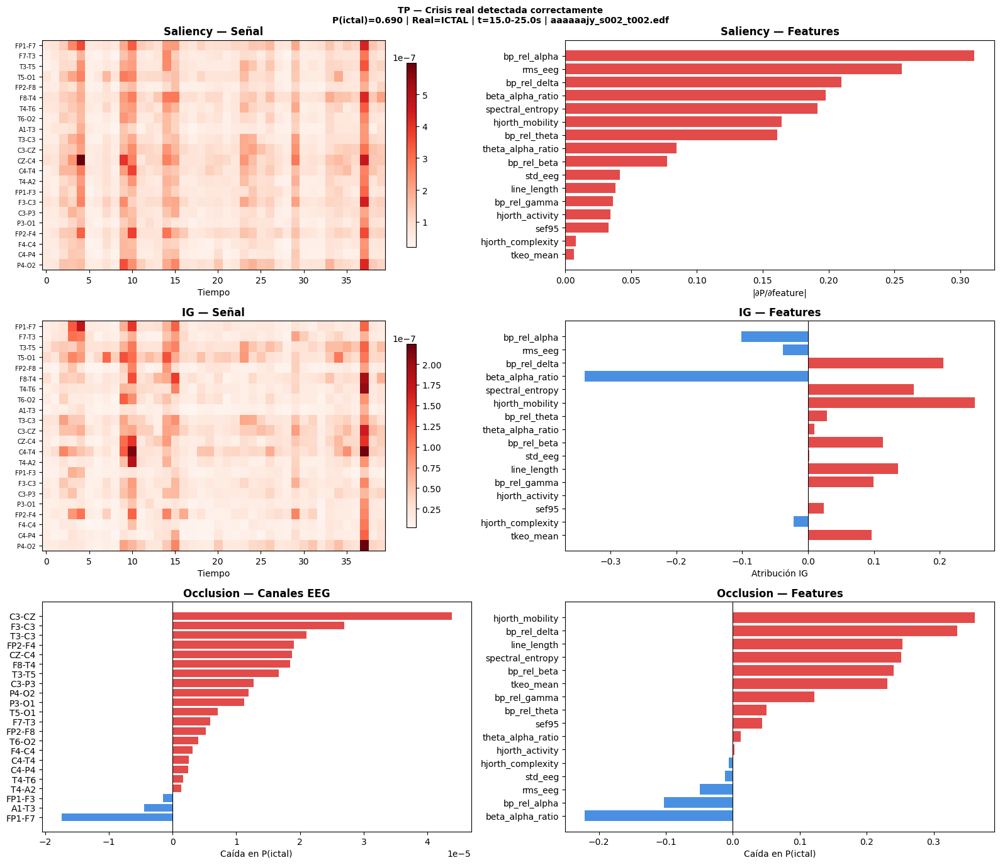

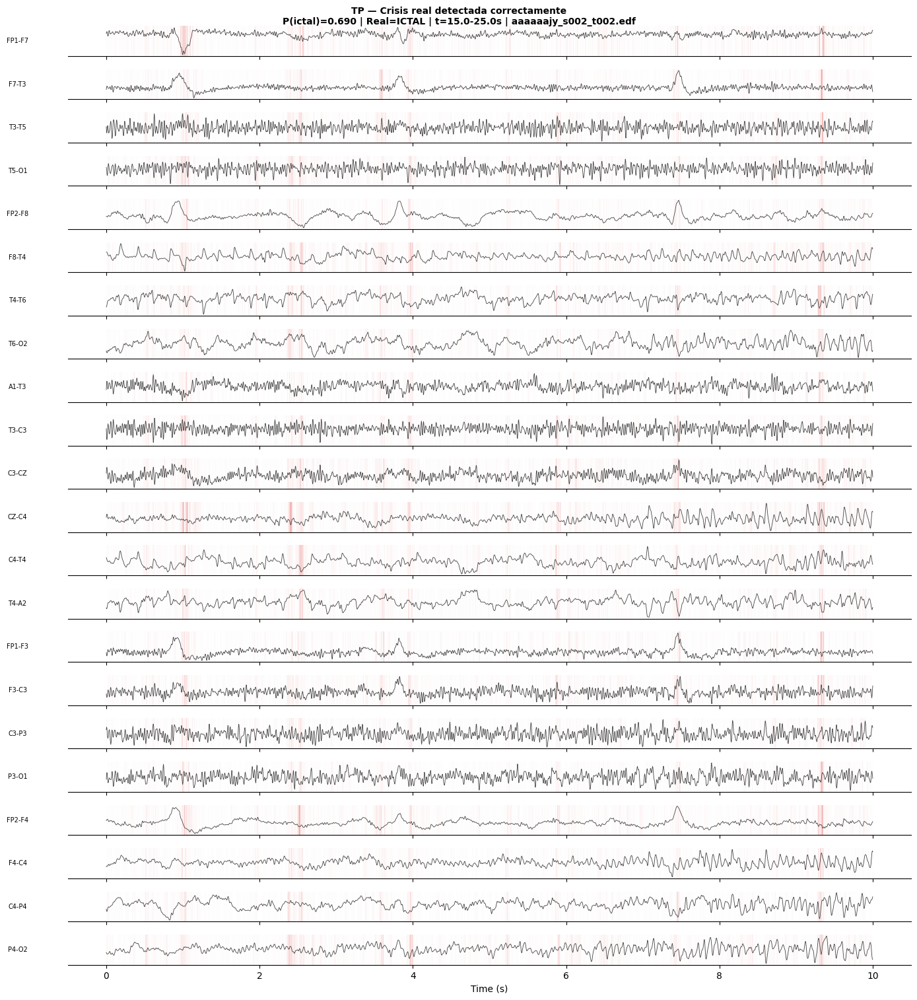

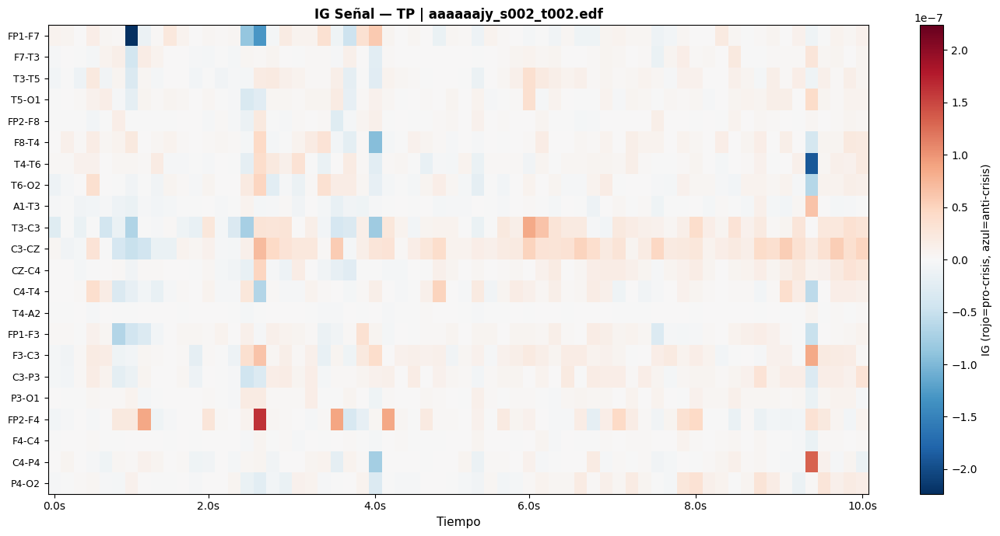

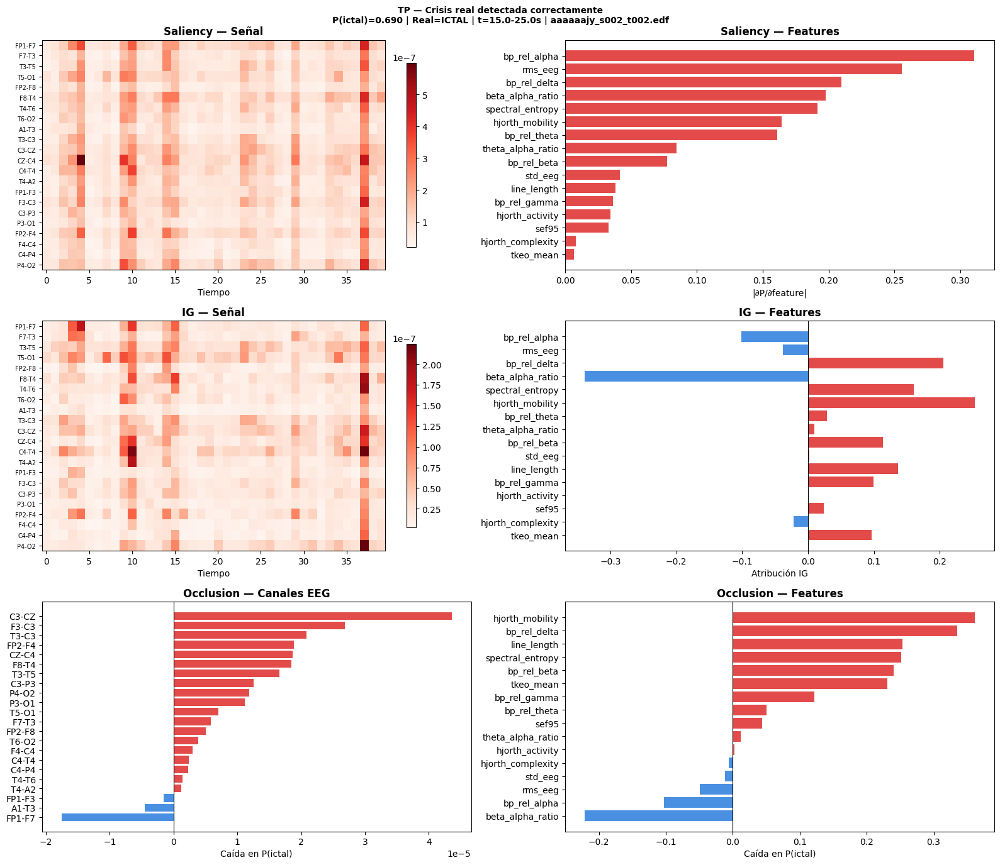

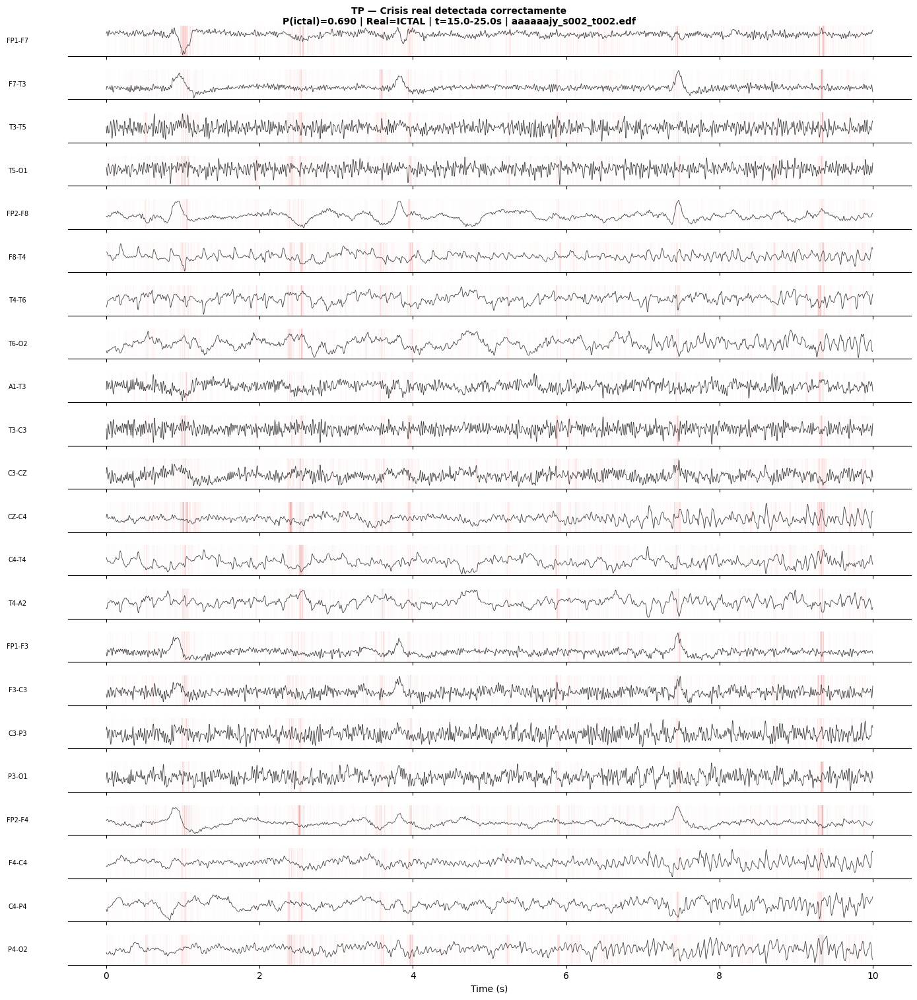

...

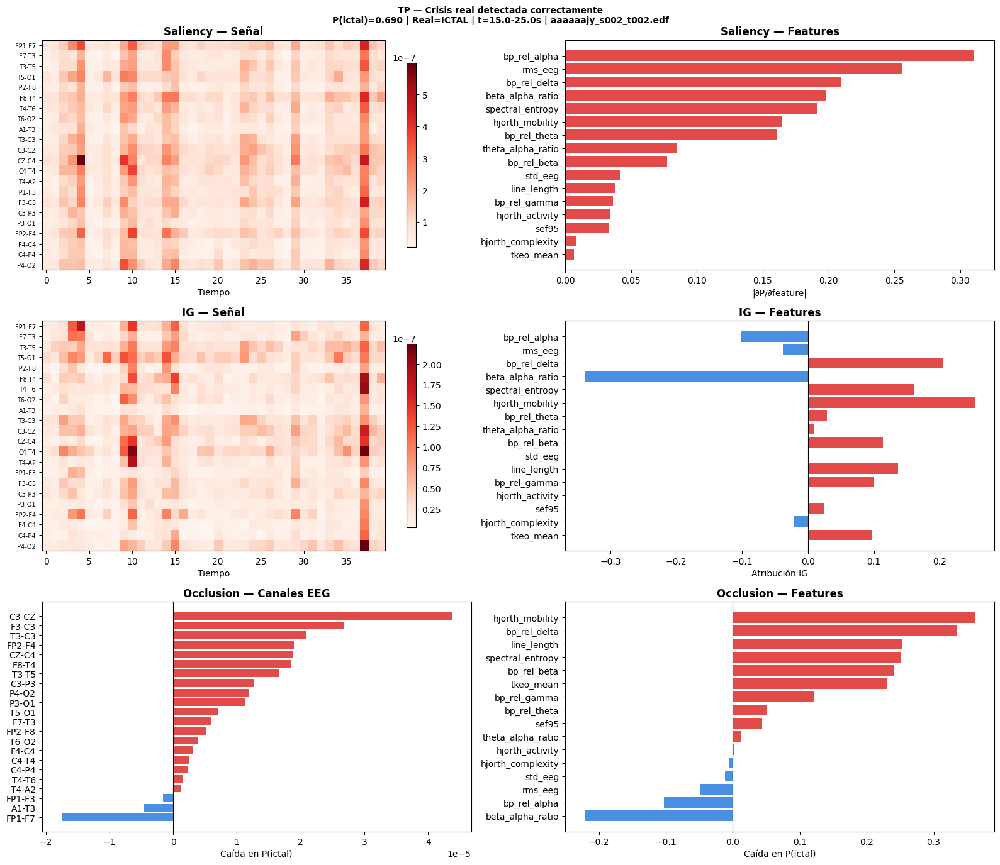

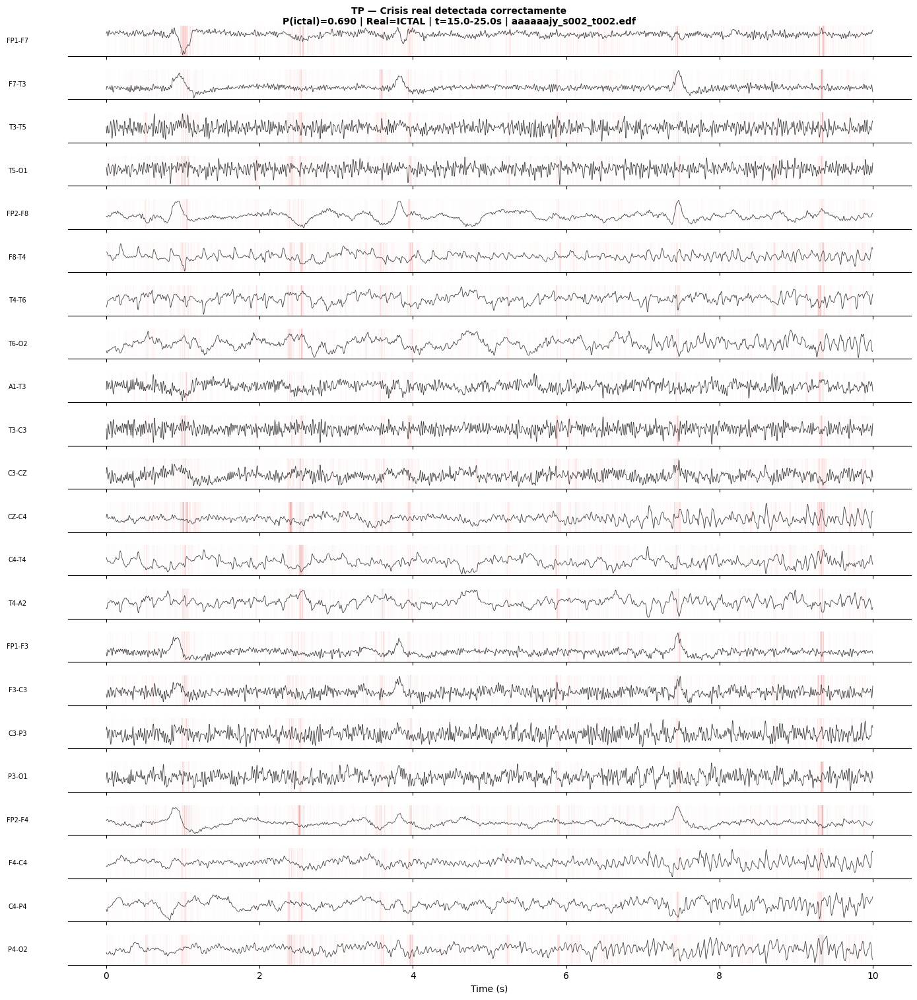

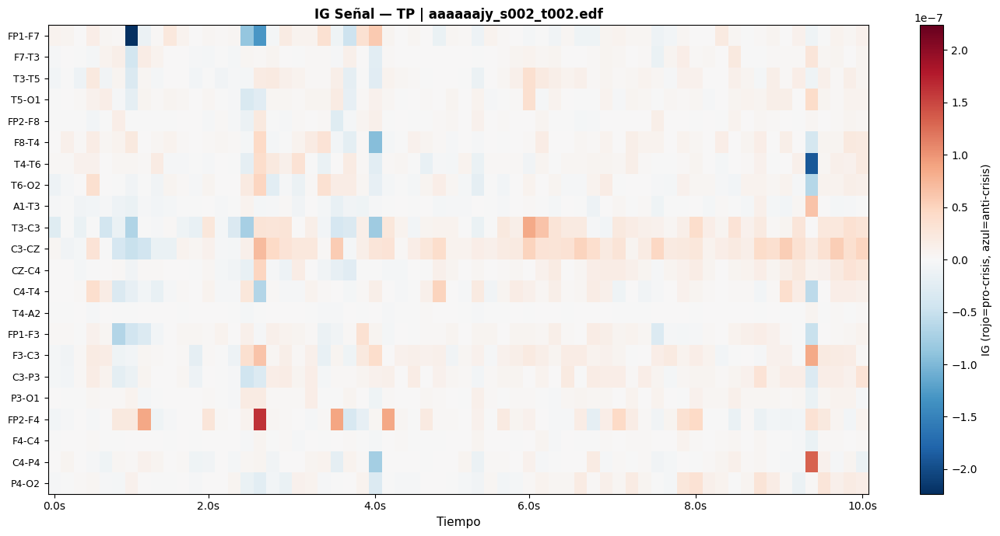

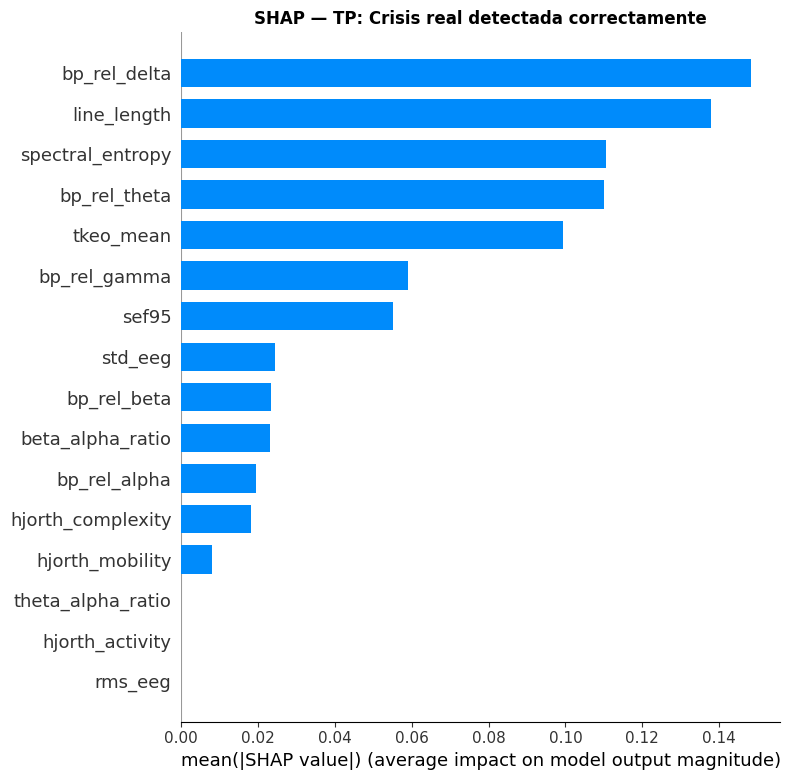

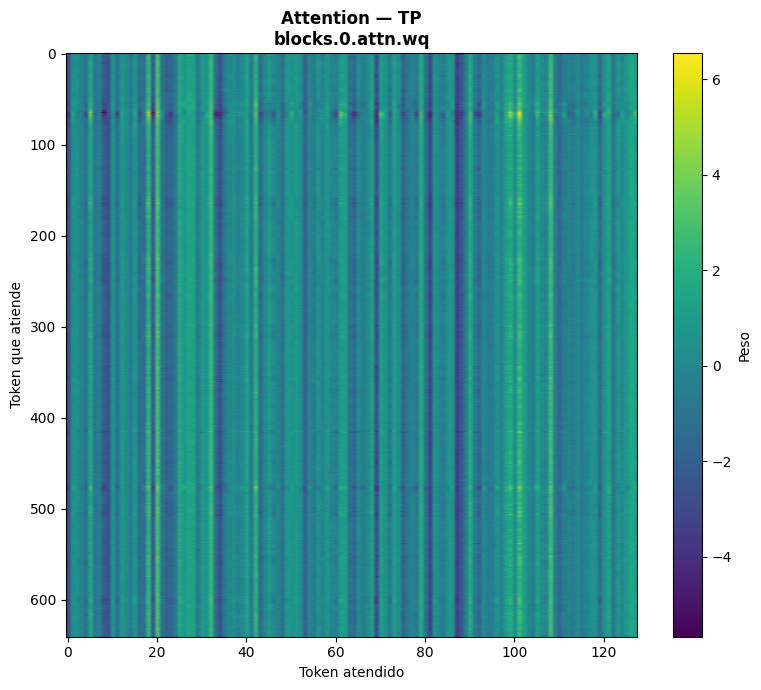


Visualizando grupo FP


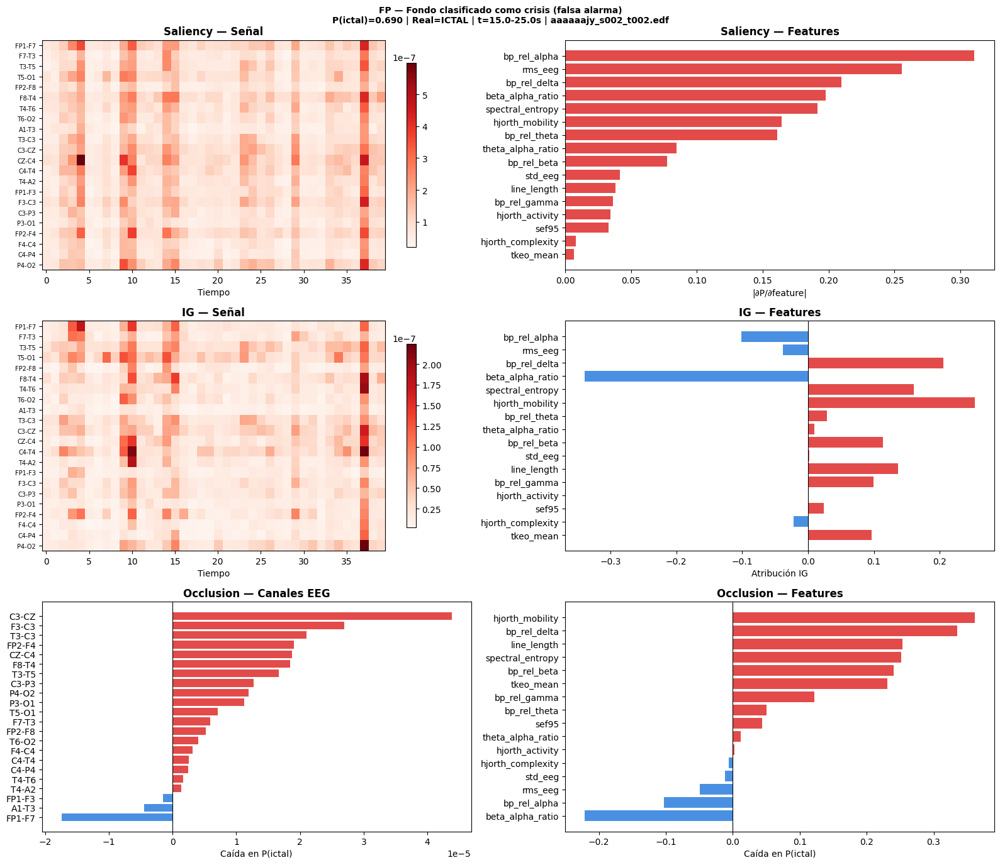

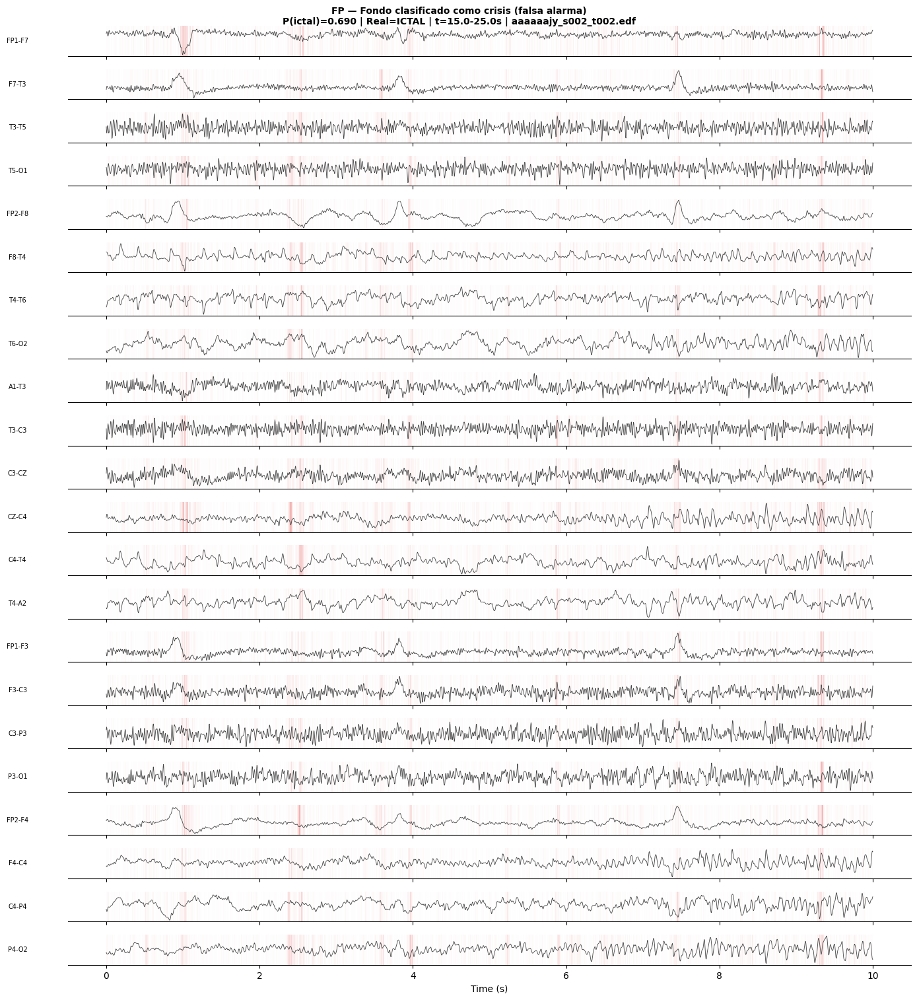

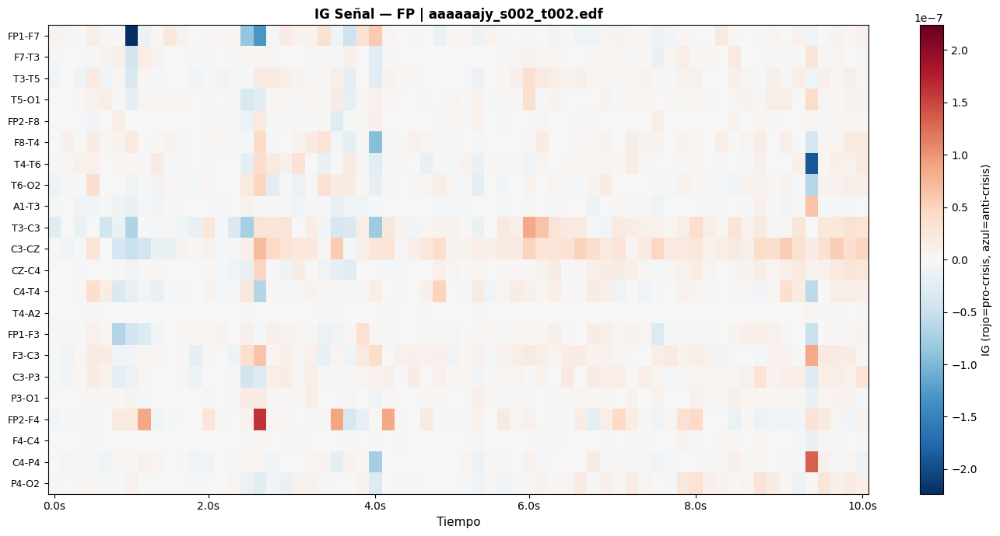

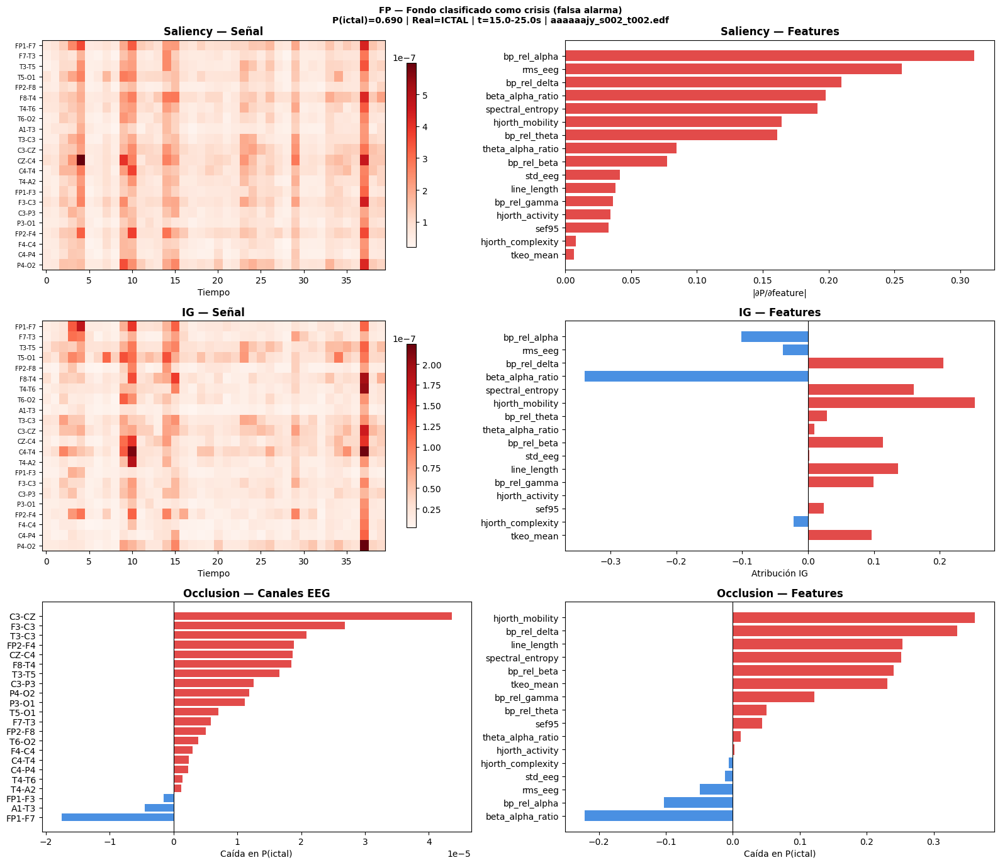

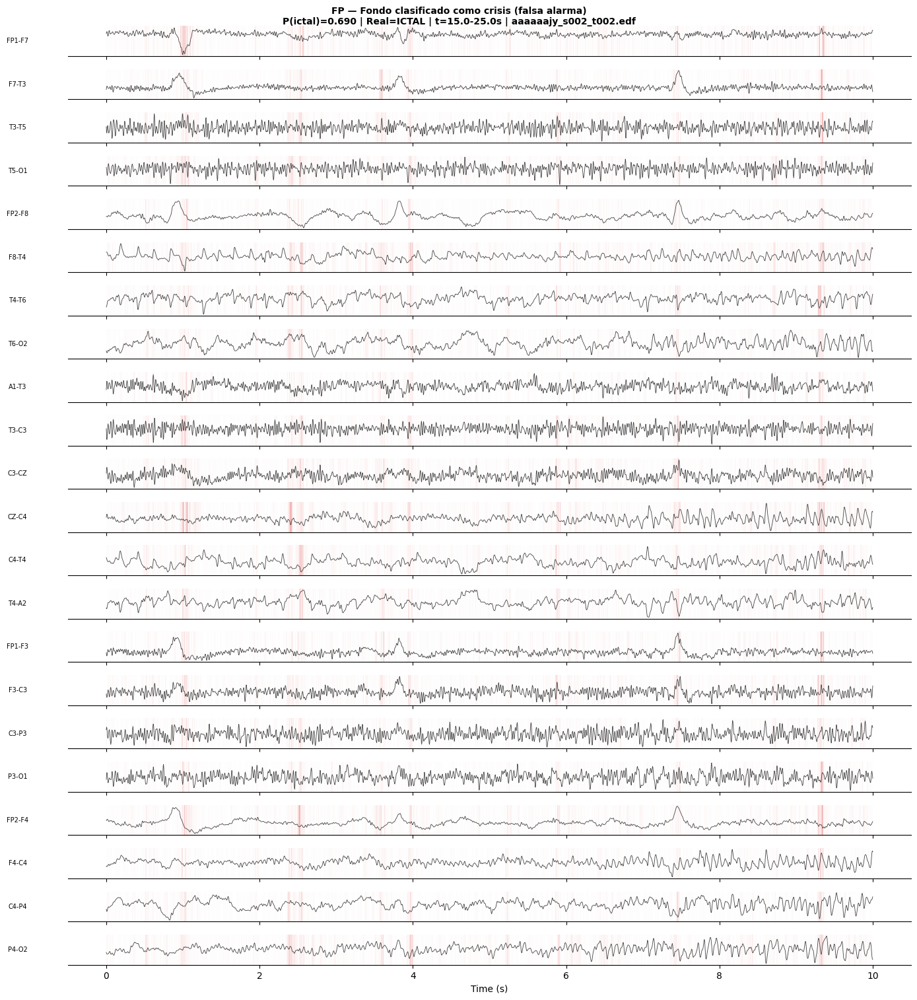

...

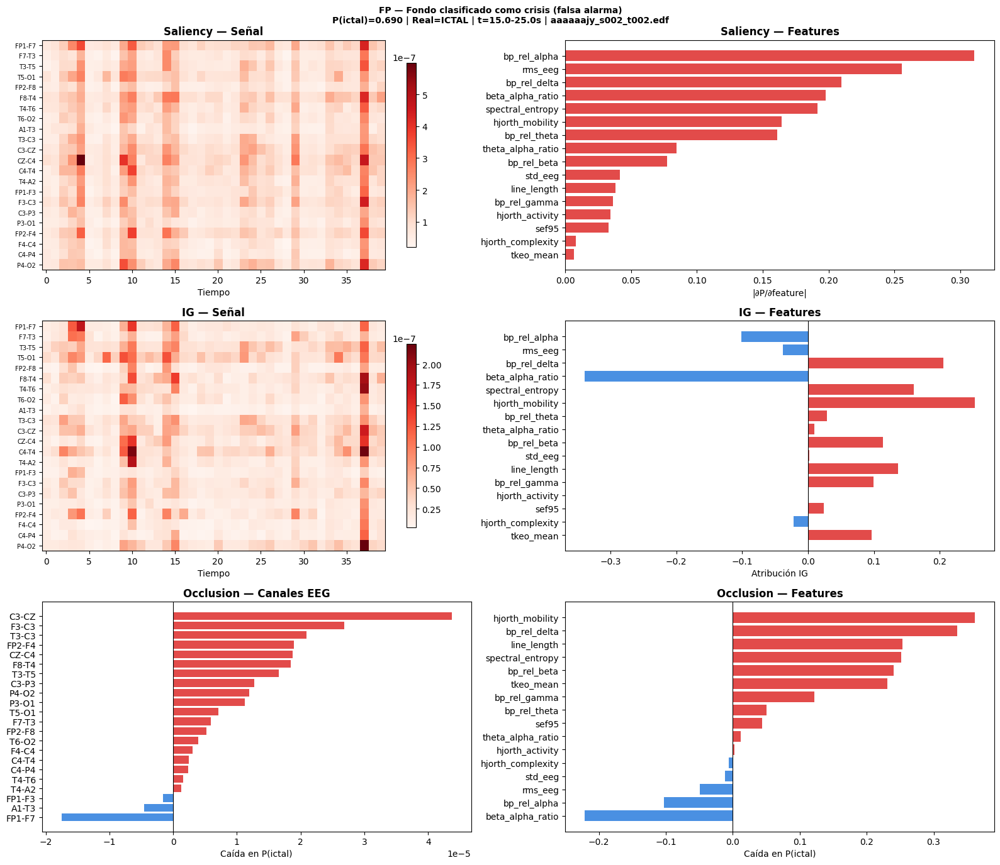

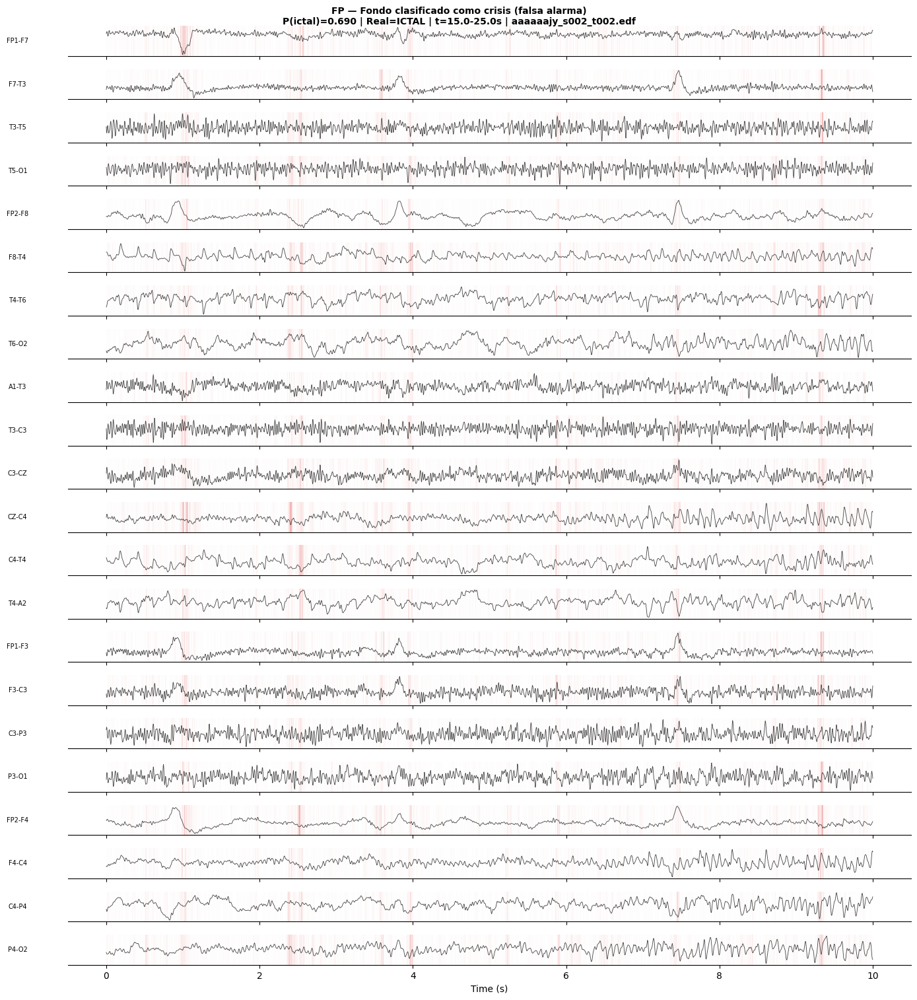

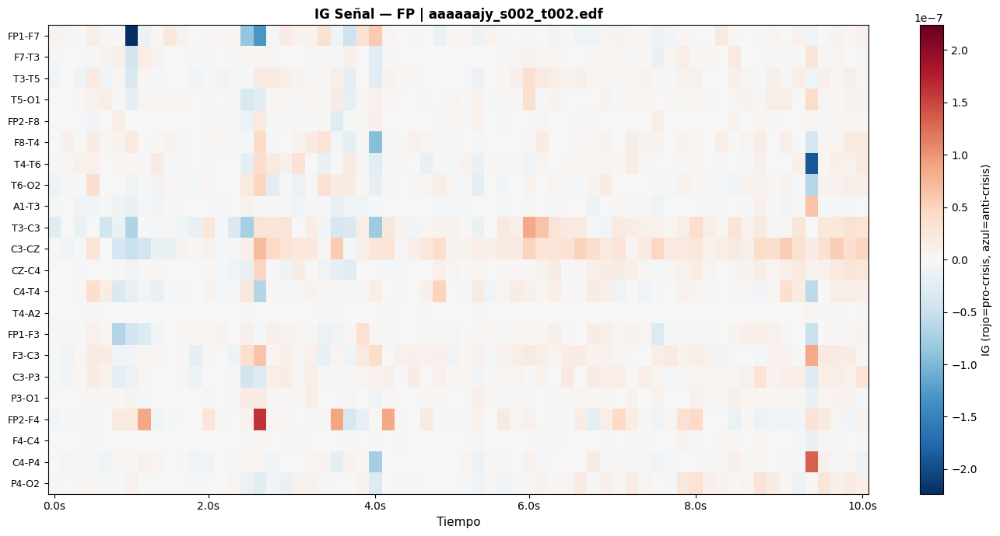

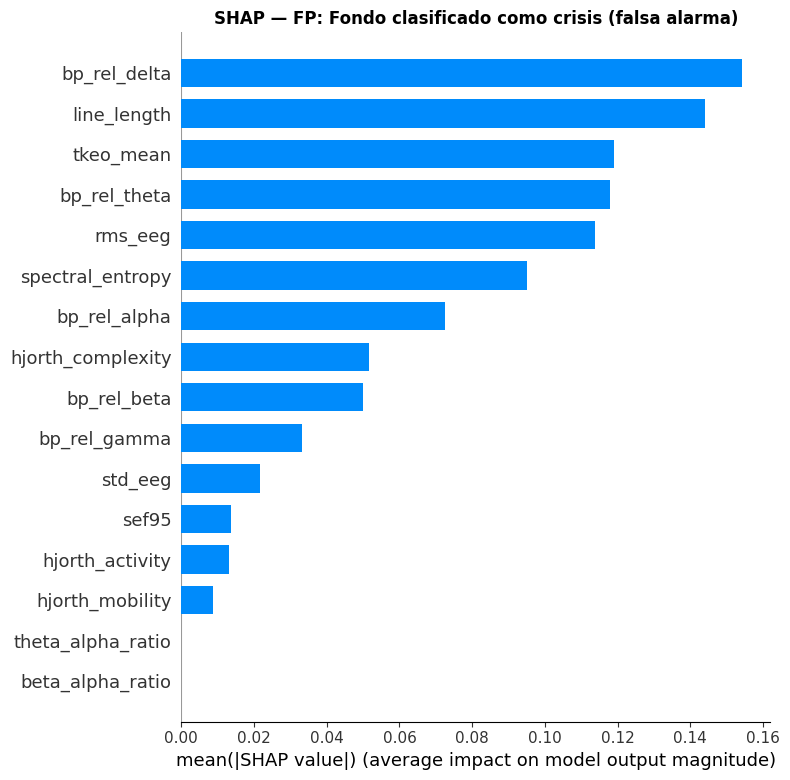

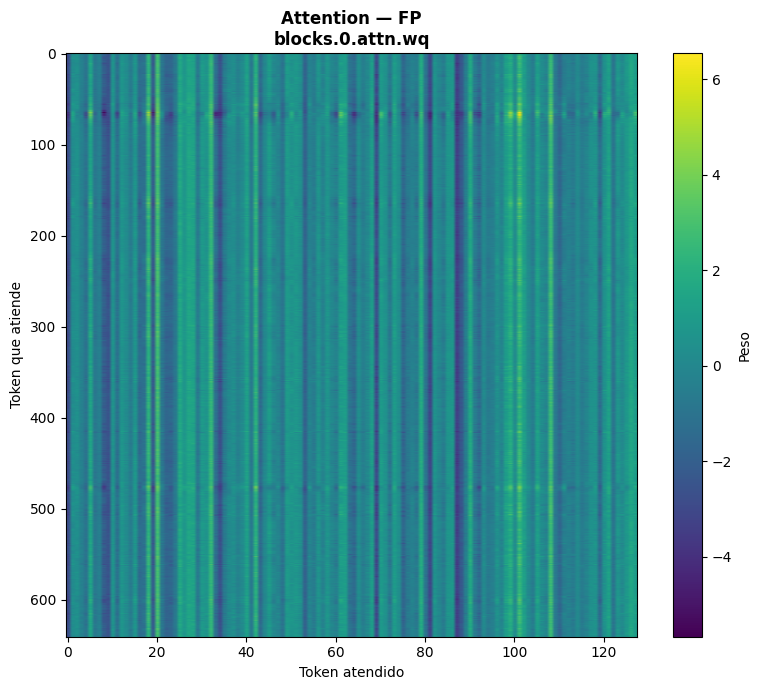


Visualizando grupo TN


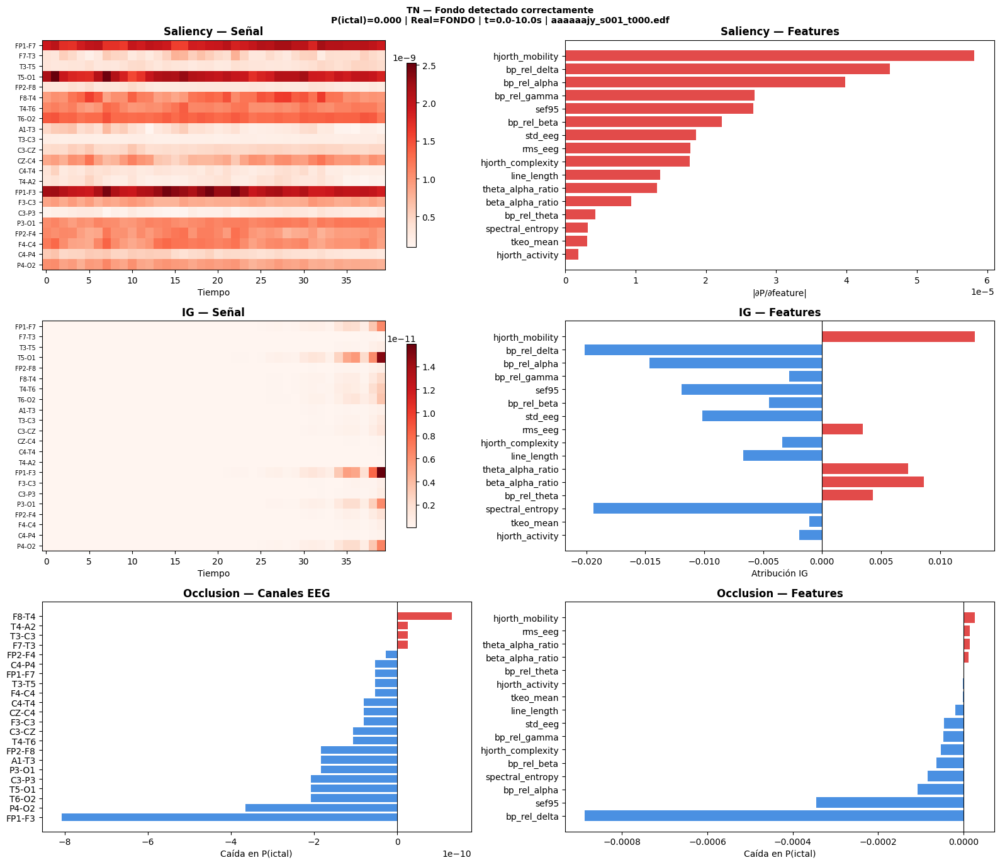

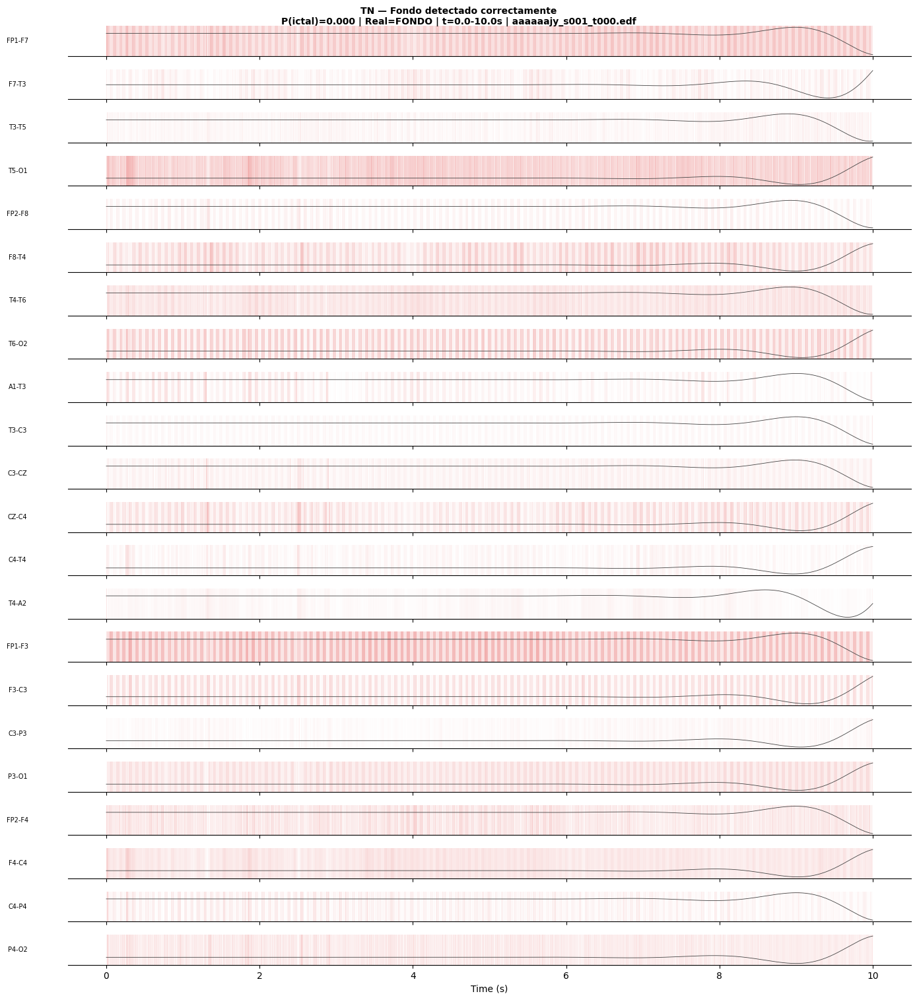

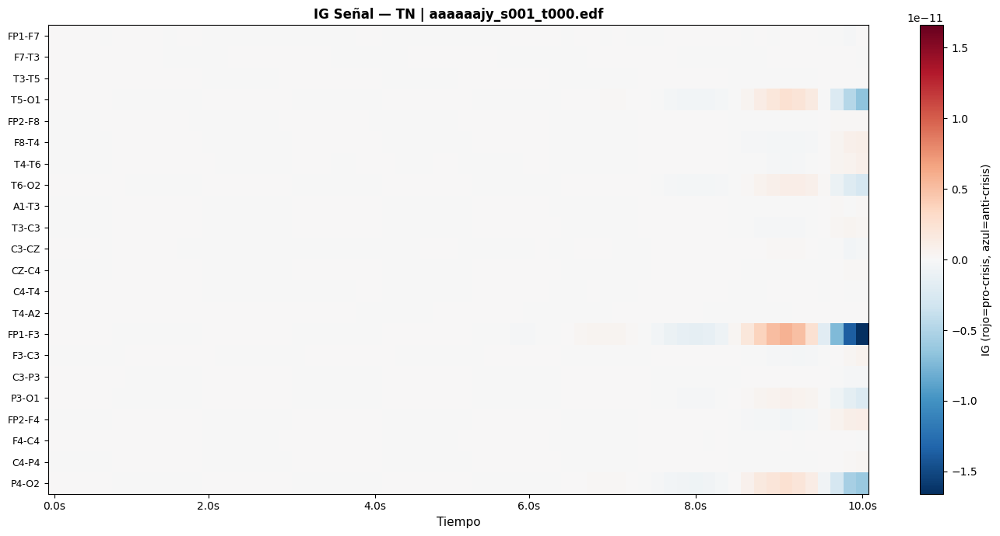

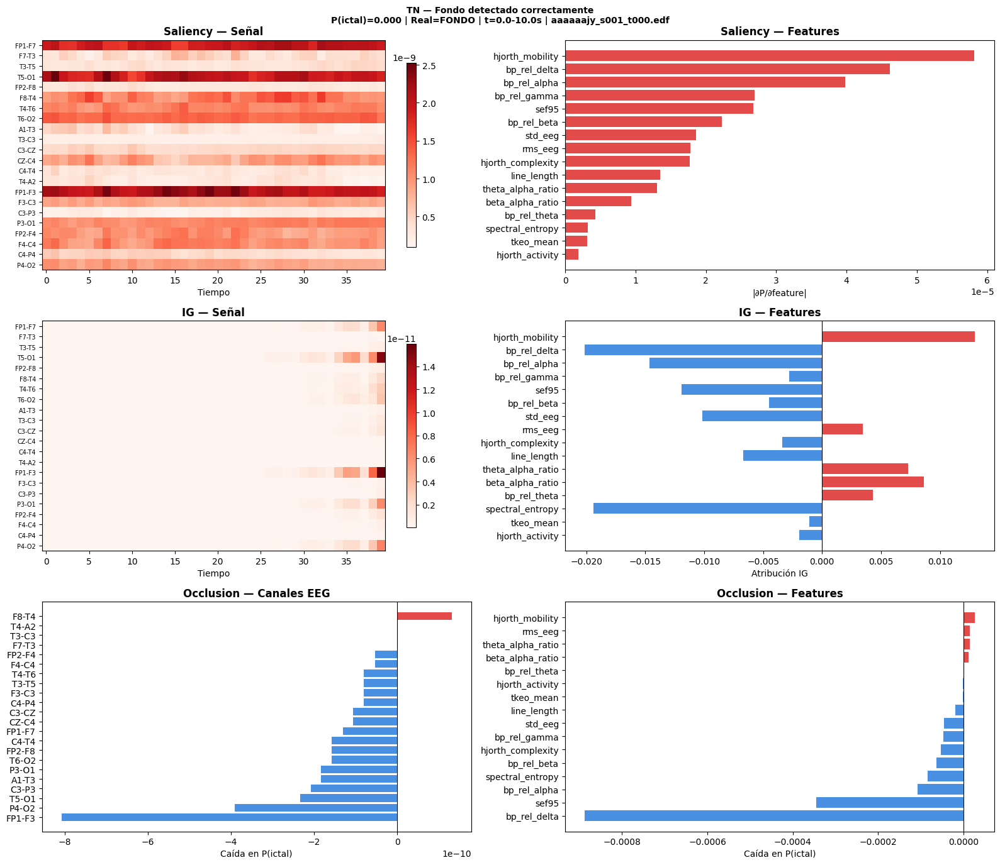

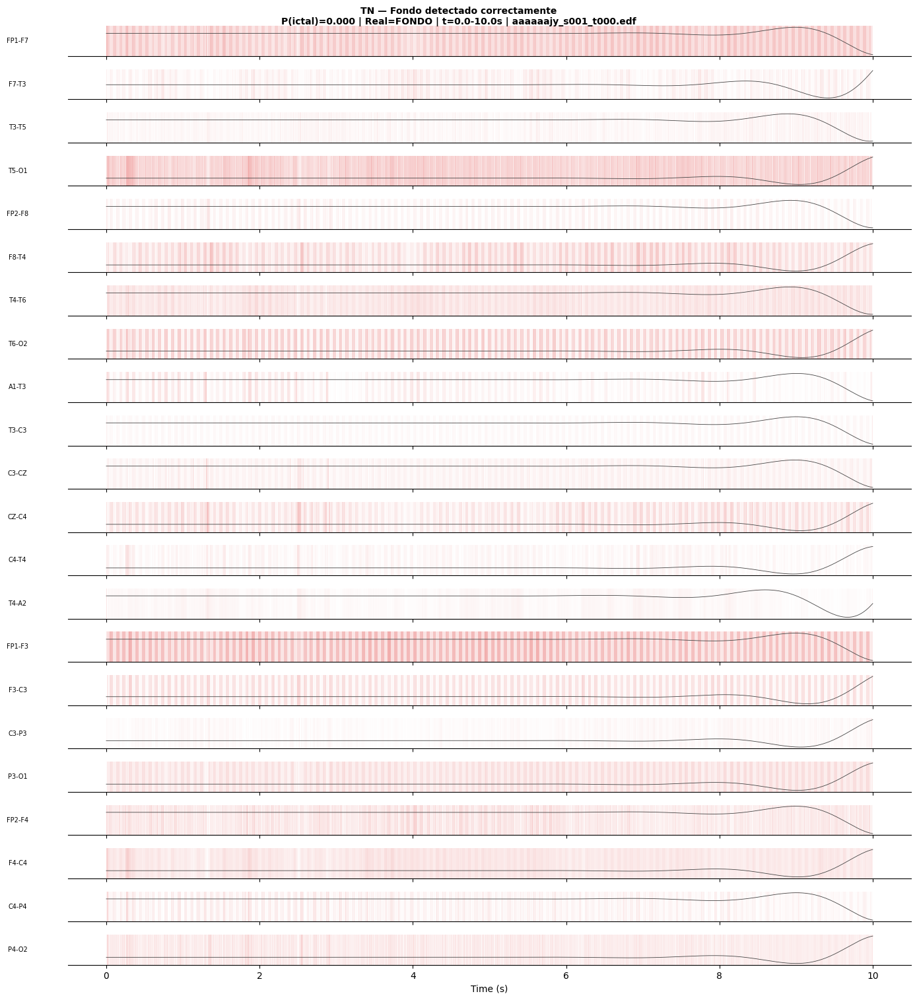

...

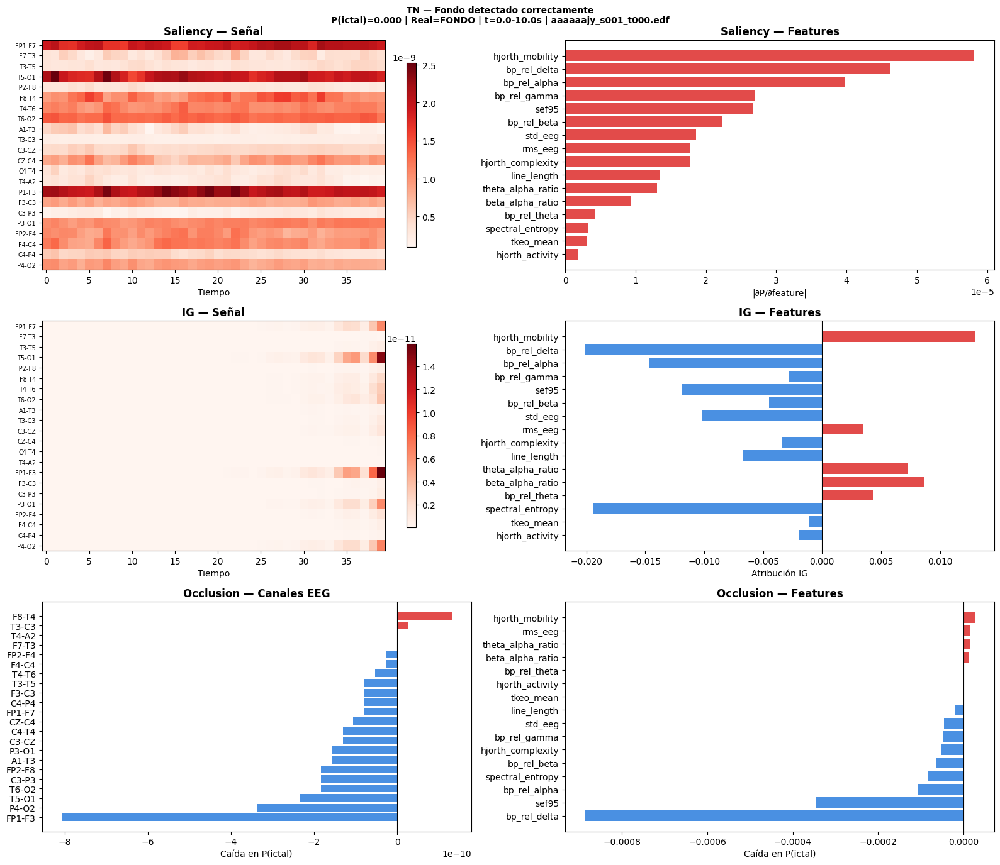

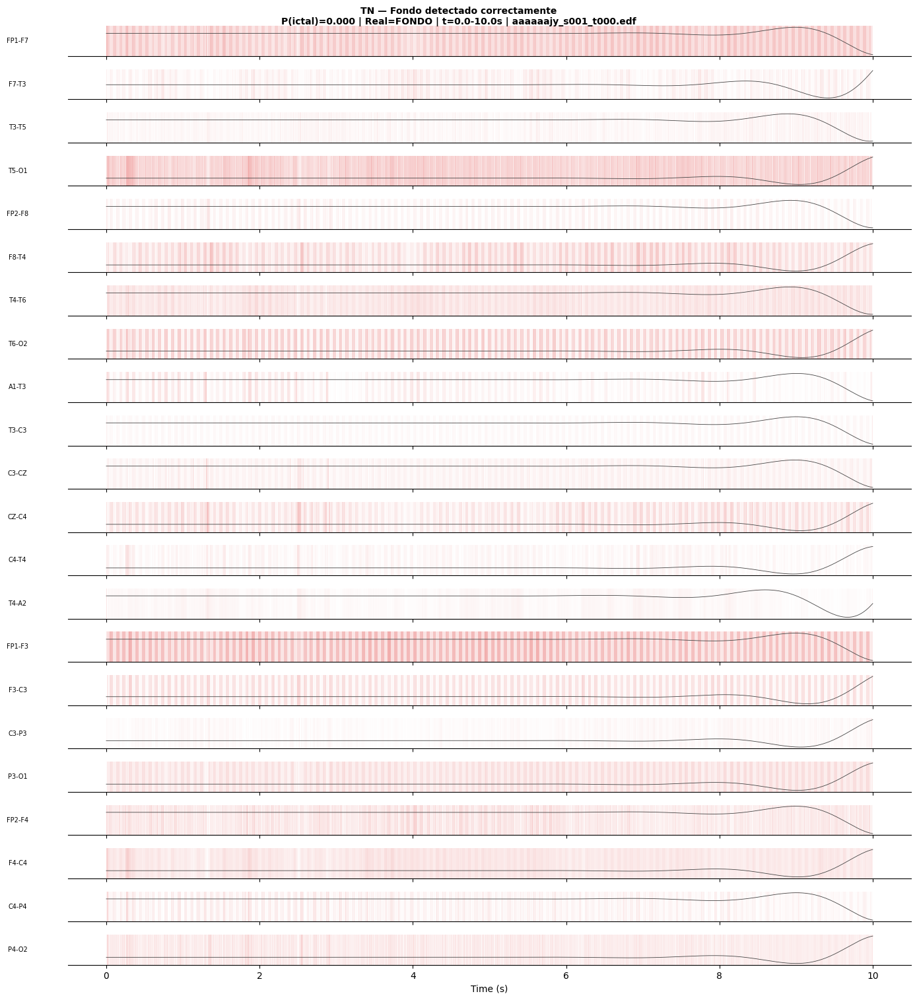

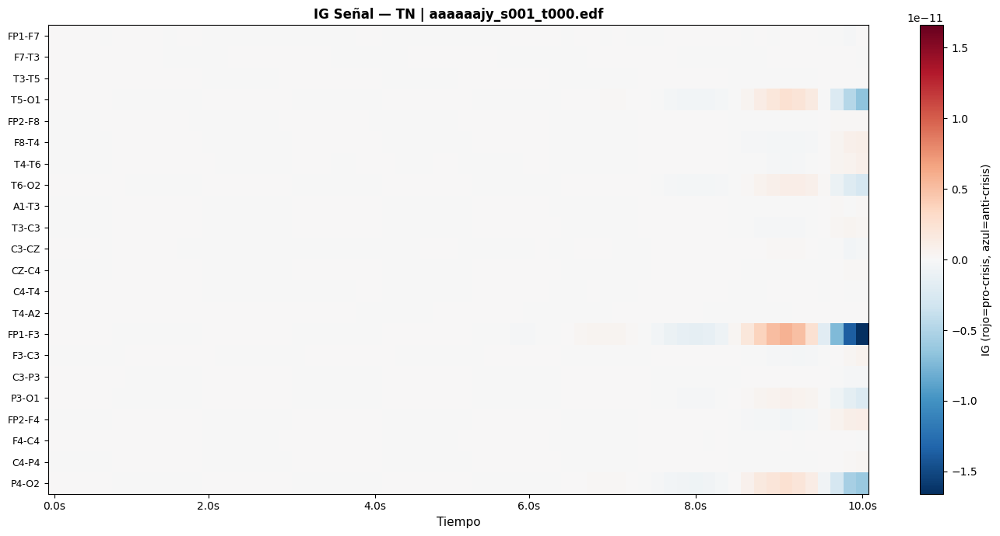

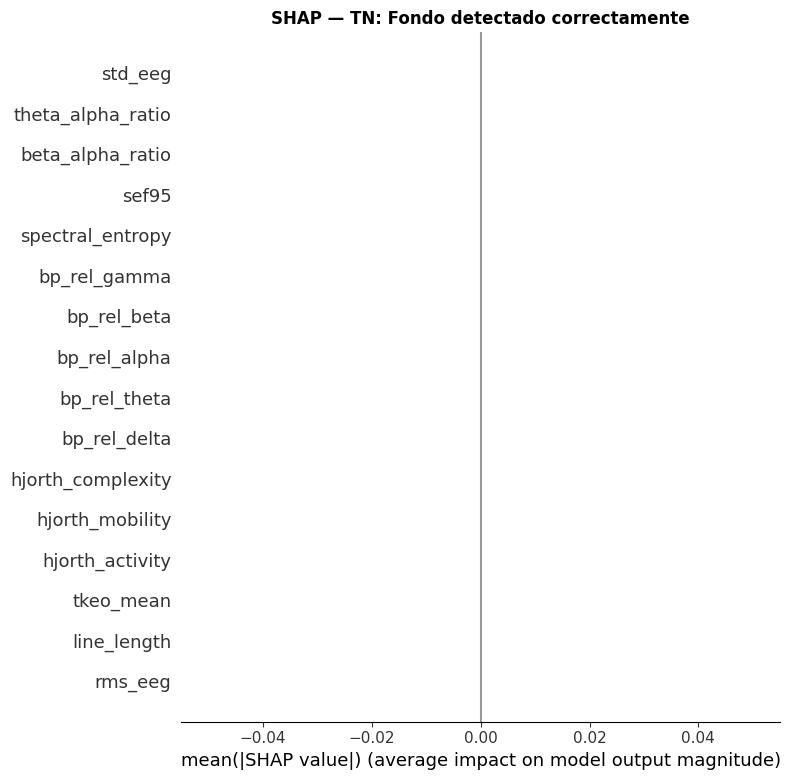

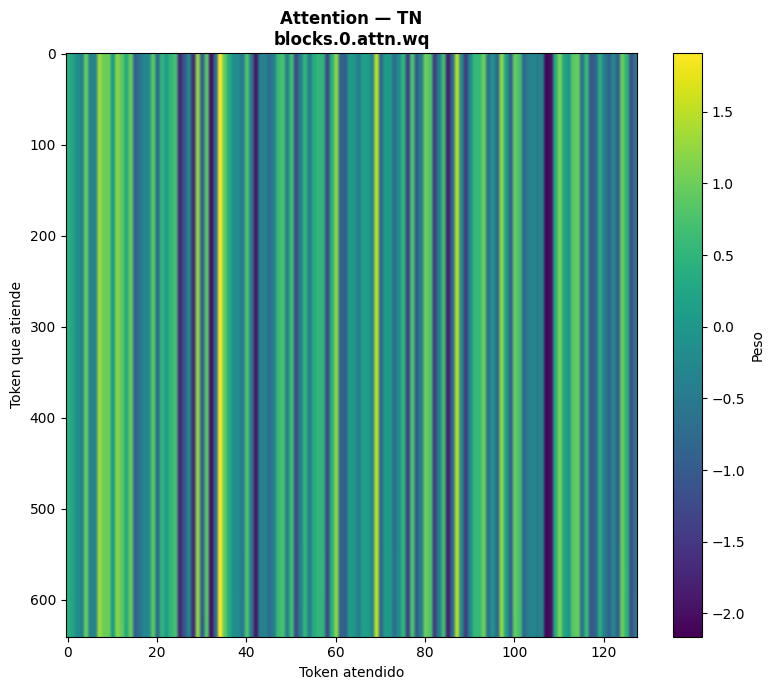


Visualizando grupo FN


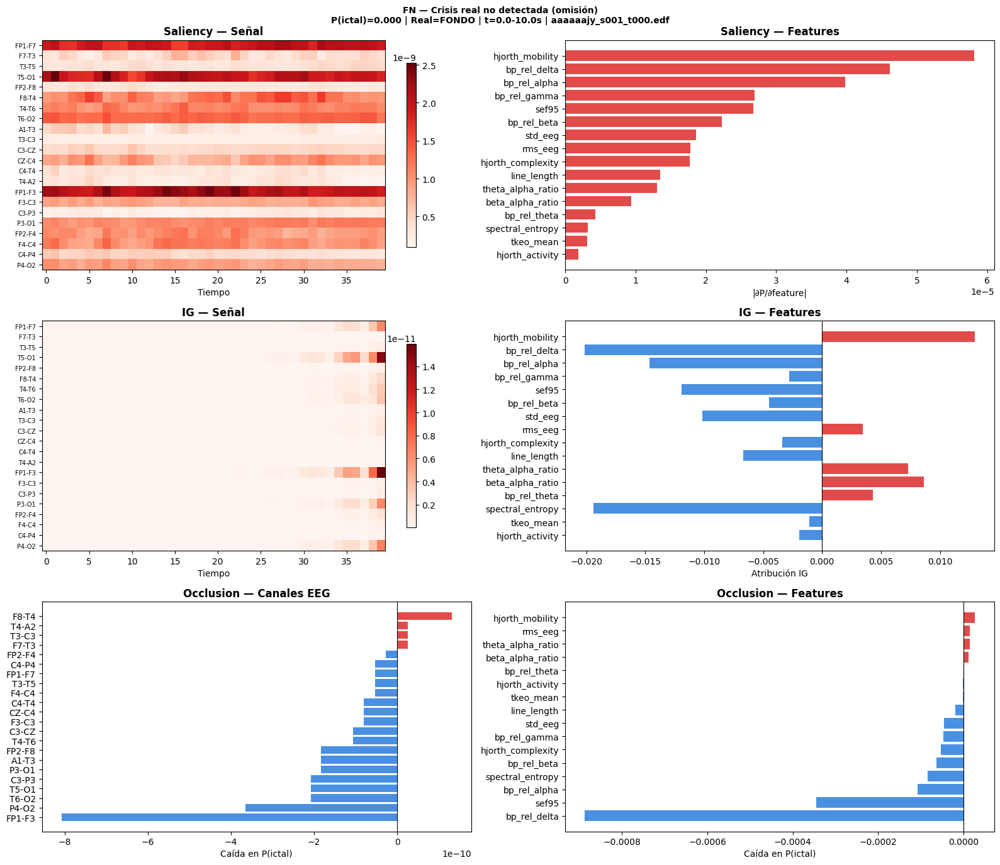

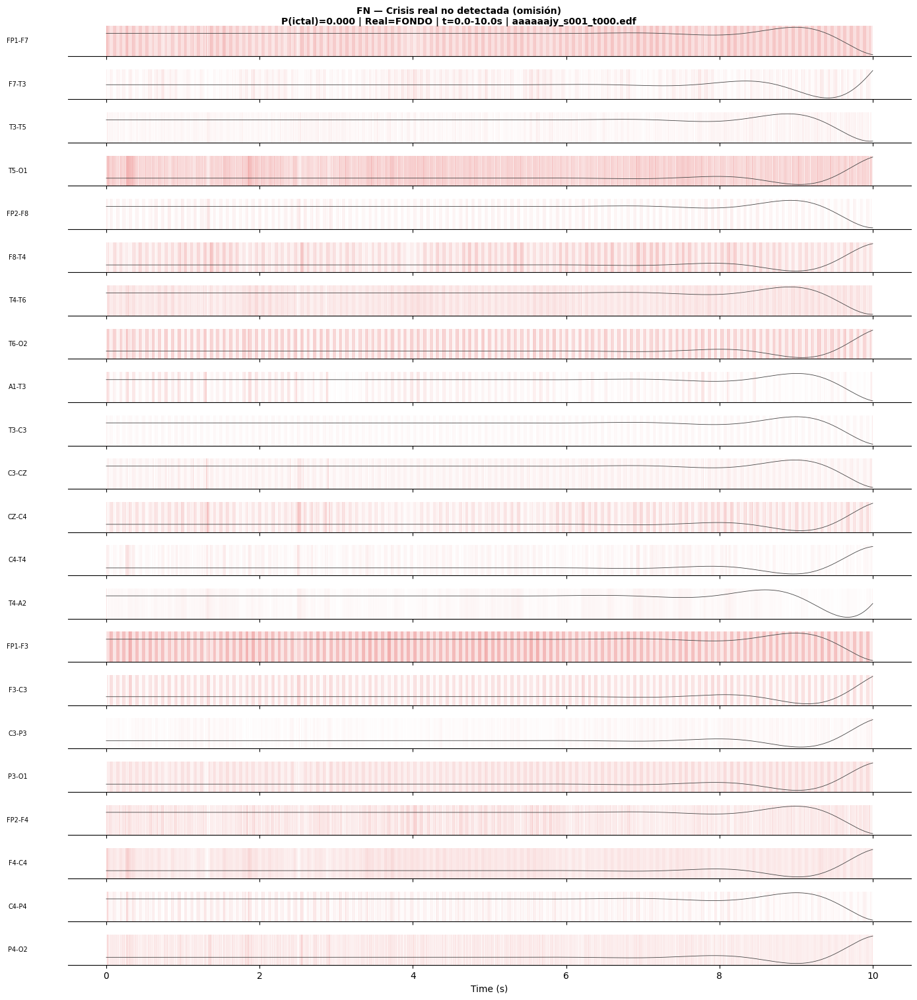

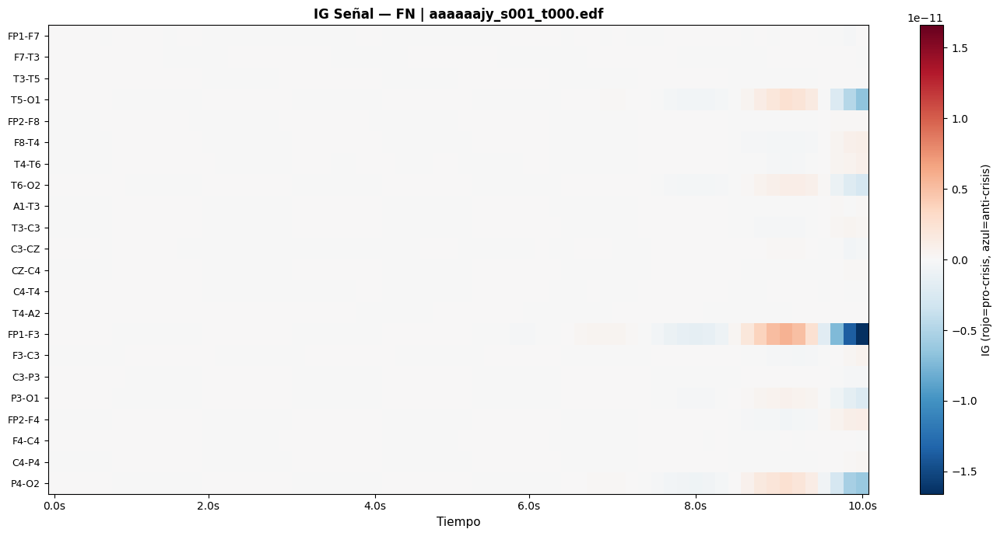

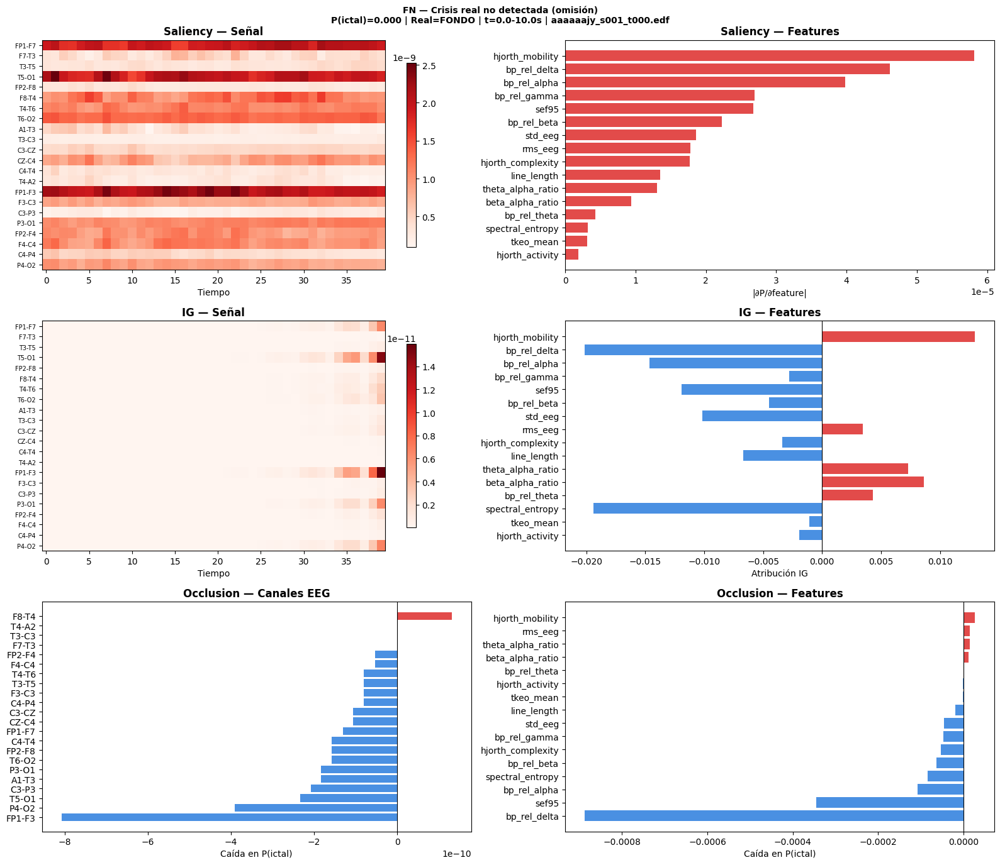

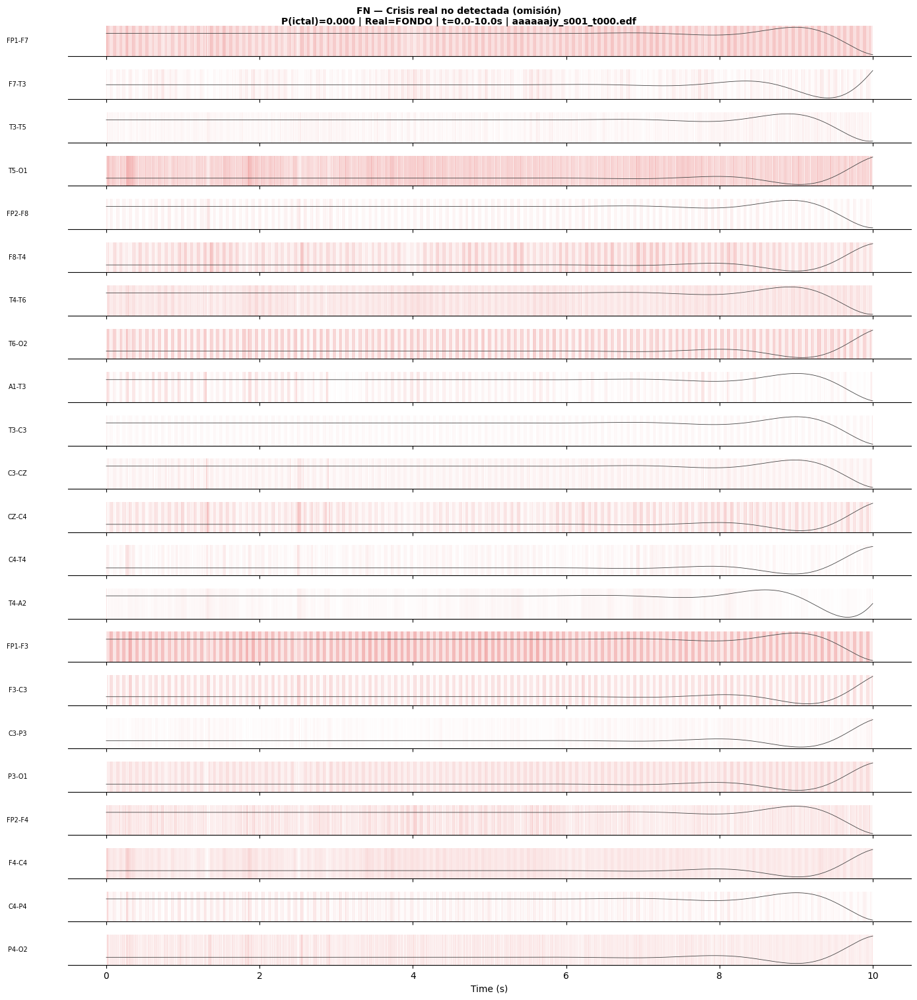

...

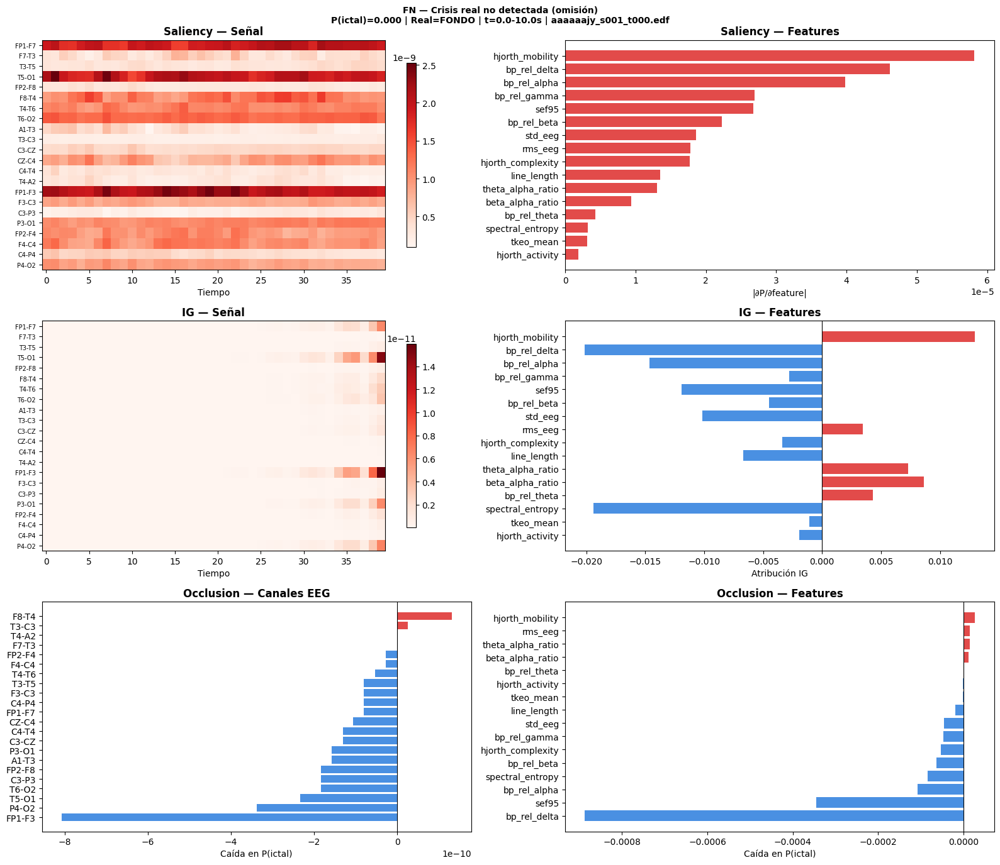

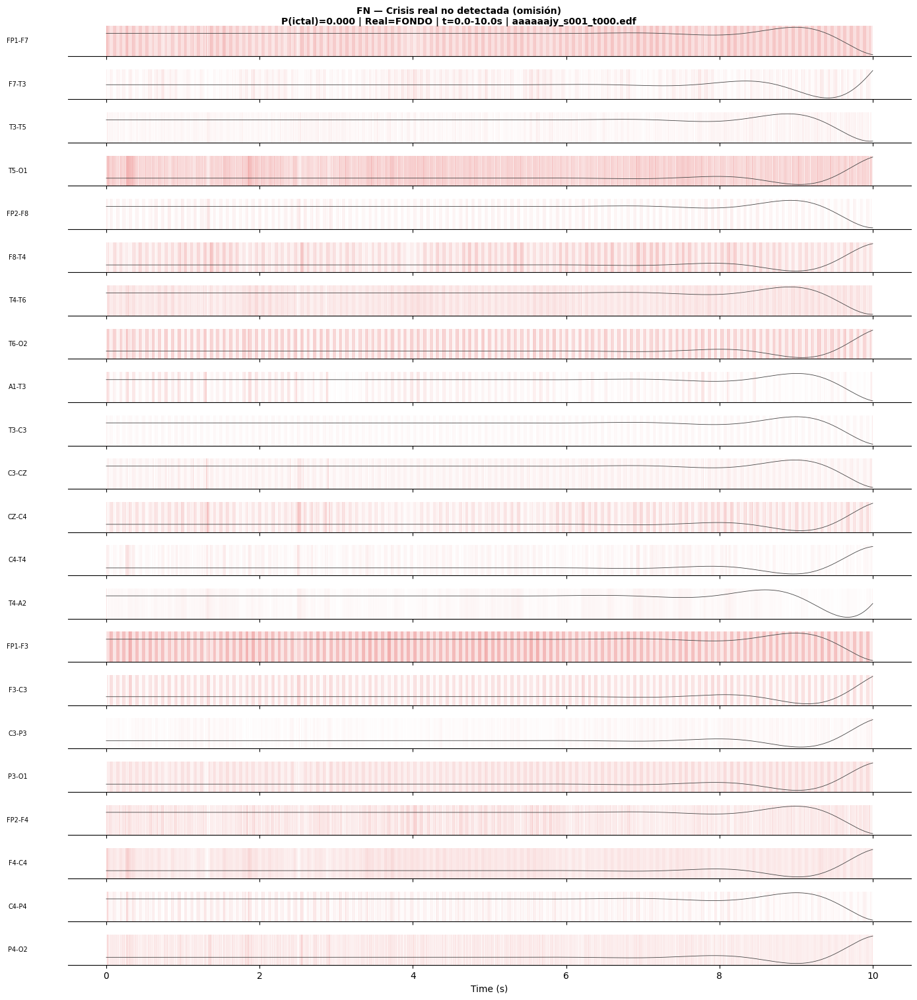

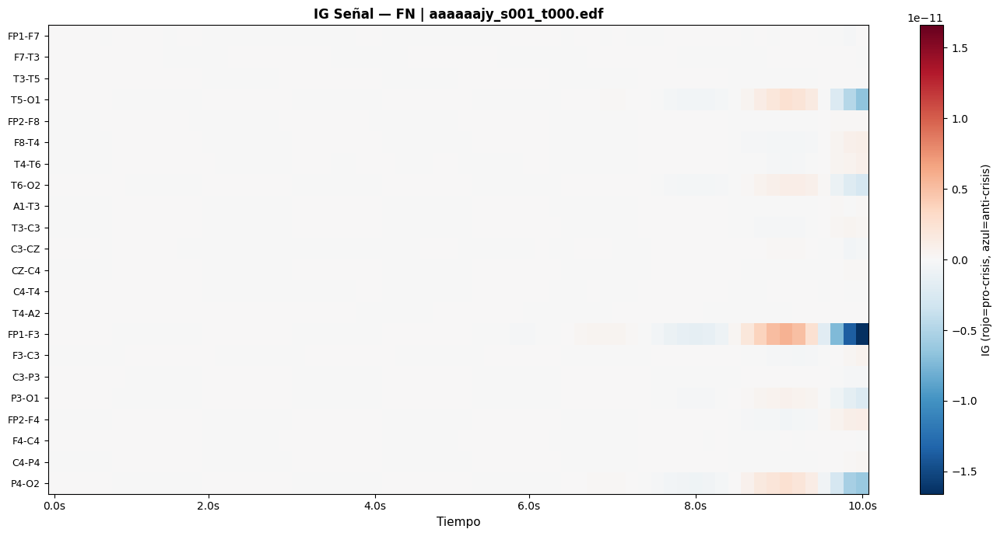

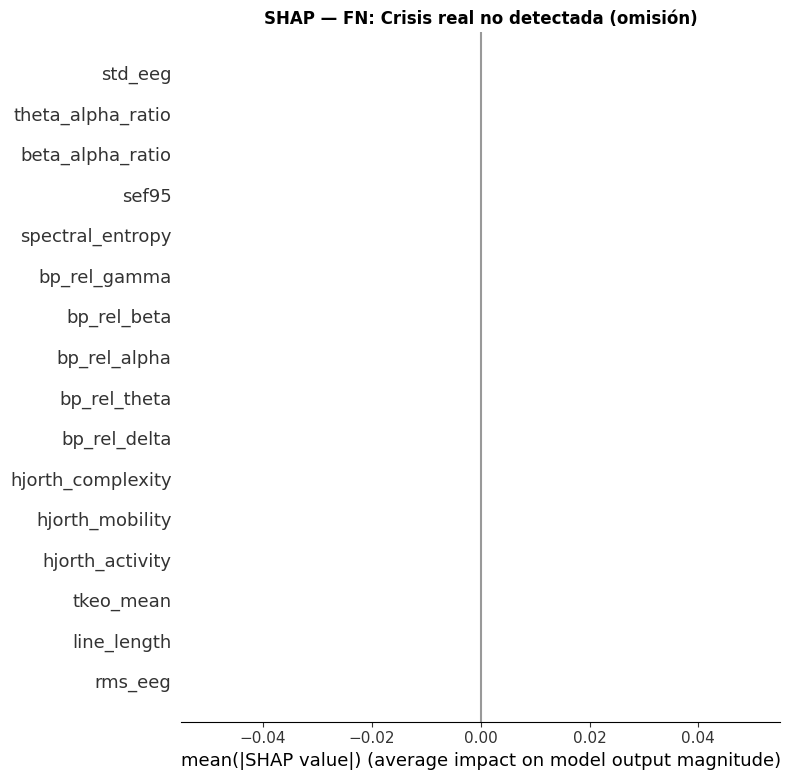

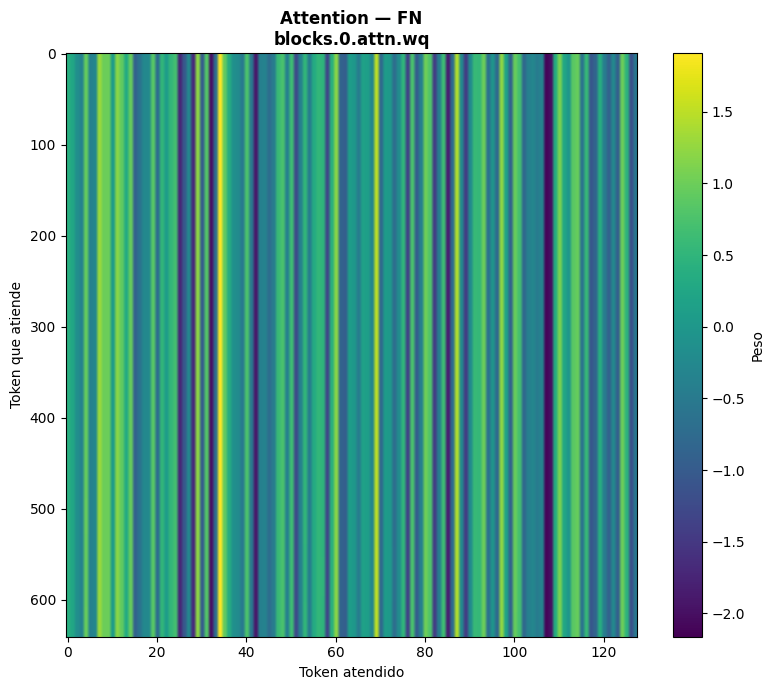


✓ Todas las figuras guardadas en: C:/Users/ferch/Documents/Various/EngineeringDesignAndInnovation/hybrid-ai-epilepsy-diagnosis/prior-work/phase-vi-2025-sanchez/sanchez_repository/results


In [87]:
# ── BLOQUE 13: Visualizaciones por grupo (VERSIÓN LIMPIA Y ROBUSTA) ─────────

descripciones_grupo = {
    'TP': 'Crisis real detectada correctamente',
    'FP': 'Fondo clasificado como crisis (falsa alarma)',
    'TN': 'Fondo detectado correctamente',
    'FN': 'Crisis real no detectada (omisión)',
}

for nombre_grupo, res in resultados.items():

    print(f"\n{'='*70}")
    print(f"Visualizando grupo {nombre_grupo}")
    print(f"{'='*70}")

    # ----------------------------------------------------------------------
    # Cargar datos robustamente
    # ----------------------------------------------------------------------
    X_g = res["X_g"]
    sel_g = np.asarray(res["sel_g"]).reshape(-1)

    n_ventanas = len(X_g)

    # ----------------------------------------------------------------------
    # VISUALIZACIÓN POR VENTANA
    # ----------------------------------------------------------------------
    for i in range(n_ventanas):

        idx_original = int(sel_g[i])

        prob = float(np.asarray(all_probs[idx_original]).reshape(-1)[0])
        label_real = int(labels_np[idx_original])

        t_info = all_times[idx_original]
        t_start = float(t_info[0])
        t_end   = float(t_info[1])

        edf_name = str(all_paths[idx_original])

        titulo = (
            f"{nombre_grupo} — {descripciones_grupo[nombre_grupo]}\n"
            f"P(ictal)={prob:.3f} | "
            f"Real={'ICTAL' if label_real == 1 else 'FONDO'} | "
            f"t={t_start:.1f}-{t_end:.1f}s | {edf_name}"
        )

        nombre_archivo = (
            f"xai_{nombre_grupo}_v{i}_"
            f"p{prob:.2f}_t{int(t_start)}"
        )

        # --------------------------------------------------------------
        # 1) Figura resumen
        # --------------------------------------------------------------
        try:
            plot_xai_summary(
                res["sal_sig"],
                res["sal_feat"],
                res["ig_sig"],
                res["ig_feat"],
                res["occ_sig"],
                res["occ_feat"],
                CHANNEL_NAMES,
                FEATURE_NAMES,
                window_idx=i,
                titulo=titulo,
                save_path=f"{SAVE_DIR}/{nombre_archivo}_summary.png"
            )
        except Exception as e:
            print(f"⚠ plot_xai_summary falló: {e}")

        # --------------------------------------------------------------
        # 2) Saliency señal detallada
        # --------------------------------------------------------------
        try:
            x_np = X_g[i].detach().cpu().numpy()

            plot_saliency_signal(
                res["sal_sig"][i],
                x_np,
                CHANNEL_NAMES,
                title=titulo,
                save_path=f"{SAVE_DIR}/{nombre_archivo}_saliency_signal.png"
            )
        except Exception as e:
            print(f"⚠ plot_saliency_signal falló: {e}")

        # --------------------------------------------------------------
        # 3) Integrated Gradients señal
        # --------------------------------------------------------------
        try:
            plot_ig_signal(
                res["ig_sig"],
                CHANNEL_NAMES,
                title=f"IG Señal — {nombre_grupo} | {edf_name}",
                save_path=f"{SAVE_DIR}/{nombre_archivo}_ig_signal.png"
            )
        except Exception as e:
            print(f"⚠ plot_ig_signal falló: {e}")

    # ----------------------------------------------------------------------
    # SHAP summary grupo completo
    # ----------------------------------------------------------------------
    try:
        shap_values = np.asarray(res["shap_feat"])

        if shap_values.ndim == 3:
            shap_values = shap_values[0]

        plt.figure(figsize=(10, 6))

        shap.summary_plot(
            shap_values,
            feature_names=FEATURE_NAMES,
            plot_type="bar",
            show=False
        )

        plt.title(
            f"SHAP — {nombre_grupo}: {descripciones_grupo[nombre_grupo]}",
            fontweight="bold"
        )

        plt.tight_layout()
        plt.savefig(
            f"{SAVE_DIR}/shap_{nombre_grupo}.png",
            dpi=200,
            bbox_inches="tight"
        )
        plt.show()

    except Exception as e:
        print(f"⚠ SHAP falló: {e}")

    # ----------------------------------------------------------------------
    # Attention weights
    # ----------------------------------------------------------------------
    try:
        if res["attn"]:

            first_layer = list(res["attn"].keys())[0]
            attn_tensor = res["attn"][first_layer]

            if attn_tensor.ndim == 4:
                # (B,H,S,S)
                attn_avg = attn_tensor.mean(dim=(0, 1)).numpy()

            elif attn_tensor.ndim == 3:
                # (B,S,S)
                attn_avg = attn_tensor.mean(dim=0).numpy()

            else:
                raise ValueError(
                    f"Shape inesperado attention: {attn_tensor.shape}"
                )

            fig, ax = plt.subplots(figsize=(8, 7))

            im = ax.imshow(
                attn_avg,
                cmap="viridis",
                aspect="auto"
            )

            ax.set_title(
                f"Attention — {nombre_grupo}\n{first_layer}",
                fontweight="bold"
            )

            ax.set_xlabel("Token atendido")
            ax.set_ylabel("Token que atiende")

            plt.colorbar(im, ax=ax, label="Peso")

            plt.tight_layout()

            plt.savefig(
                f"{SAVE_DIR}/attention_{nombre_grupo}.png",
                dpi=200,
                bbox_inches="tight"
            )

            plt.show()

    except Exception as e:
        print(f"⚠ Attention falló: {e}")

print(f"\n✓ Todas las figuras guardadas en: {SAVE_DIR}")

### Final summary

In [88]:
# ── BLOQUE 14: Resumen cuantitativo ──────────────────────────────────────────
print("\n" + "="*60)
print("RESUMEN CUANTITATIVO FINAL")
print("="*60)

for nombre_grupo, res in resultados.items():
    print(f"\n── {nombre_grupo}: {descripciones_grupo[nombre_grupo]} ──")
    print(f"  Ventanas analizadas: {len(res['X_g'])}")
    print(f"  P(ictal) promedio:   {res['baseline'].mean():.3f}")

    # Top canal por occlusion
    occ_ch_mean = res['occ_sig'].mean(axis=0)
    top_ch      = np.argmax(occ_ch_mean)
    print(f"  Canal más importante (Occlusion): "
          f"{CHANNEL_NAMES[top_ch]} (caída={occ_ch_mean[top_ch]:.4f})")

    # Top feature por occlusion
    occ_f_mean = res['occ_feat'].mean(axis=0)
    top_f      = np.argmax(occ_f_mean)
    print(f"  Feature más importante (Occlusion): "
          f"{FEATURE_NAMES[top_f]} (caída={occ_f_mean[top_f]:.4f})")

    # Top feature por SHAP
    shap_mean = np.abs(res['shap_feat']).mean(axis=0)
    top_shap  = np.argmax(shap_mean)
    print(f"  Feature más importante (SHAP): "
          f"{FEATURE_NAMES[top_shap]} (|φ|={shap_mean[top_shap]:.5f})")

# Guardar resumen en JSON
resumen_json = {}
for nombre_grupo, res in resultados.items():
    occ_ch_mean = res['occ_sig'].mean(axis=0)
    occ_f_mean  = res['occ_feat'].mean(axis=0)
    shap_mean   = np.abs(res['shap_feat']).mean(axis=0)
    resumen_json[nombre_grupo] = {
        'n_ventanas':            len(res['X_g']),
        'prob_promedio':         float(res['baseline'].mean()),
        'top_canal_occlusion':   CHANNEL_NAMES[np.argmax(occ_ch_mean)],
        'top_feature_occlusion': FEATURE_NAMES[np.argmax(occ_f_mean)],
        'top_feature_shap':      FEATURE_NAMES[np.argmax(shap_mean)],
        'occ_canales':           {CHANNEL_NAMES[i]: float(occ_ch_mean[i])
                                  for i in range(len(CHANNEL_NAMES))},
        'occ_features':          {FEATURE_NAMES[i]: float(occ_f_mean[i])
                                  for i in range(N_FEATURES)},
        'shap_features':         {FEATURE_NAMES[i]: float(shap_mean[i])
                                  for i in range(N_FEATURES)},
    }

with open(f'{SAVE_DIR}/xai_resumen_cuantitativo.json', 'w') as f:
    json.dump(resumen_json, f, indent=2, ensure_ascii=False)

print(f"\n✓ Resumen guardado en: {SAVE_DIR}/xai_resumen_cuantitativo.json")


RESUMEN CUANTITATIVO FINAL

── TP: Crisis real detectada correctamente ──
  Ventanas analizadas: 3
  P(ictal) promedio:   0.690
  Canal más importante (Occlusion): C3-CZ (caída=0.0000)
  Feature más importante (Occlusion): hjorth_mobility (caída=0.3616)
  Feature más importante (SHAP): bp_rel_delta (|φ|=0.14843)

── FP: Fondo clasificado como crisis (falsa alarma) ──
  Ventanas analizadas: 3
  P(ictal) promedio:   0.690
  Canal más importante (Occlusion): C3-CZ (caída=0.0000)
  Feature más importante (Occlusion): hjorth_mobility (caída=0.3616)
  Feature más importante (SHAP): bp_rel_delta (|φ|=0.15425)

── TN: Fondo detectado correctamente ──
  Ventanas analizadas: 3
  P(ictal) promedio:   0.000
  Canal más importante (Occlusion): F8-T4 (caída=0.0000)
  Feature más importante (Occlusion): hjorth_mobility (caída=0.0000)
  Feature más importante (SHAP): rms_eeg (|φ|=0.00000)

── FN: Crisis real no detectada (omisión) ──
  Ventanas analizadas: 3
  P(ictal) promedio:   0.000
  Canal más i

# INDIVIDUAL ANALYSIS
### XAI models considered
- Shapley values
- Local Interpretable Model-agnostic Explanations

### Saliency Map
This method analyzes the magnitude of changing the value of the point $x[t, ch]$ on the crisis probability.  

Mathematically:  
  
$$\text{Saliency}[t, ch] = \left| \frac{\partial P(\text{ictal})}{\partial x[t, ch]} \right|$$


It calcualtes the gradient of the window but with an efficient algorithm.
$$\frac{\partial (P₀+P₁+...+P₉)}{\partial x} = \frac{\partial P₀}{\partial x} + \frac{\partial P₁}{\partial x} ... + \frac{\partial P₉}{\partial x} $$

Due to its mathematical definition, its limited by the gradient saturation. If the model is sure so the probability is almost 1, the gradient can be 0 no matter its a key point.  

Solution: Simonyan et al. (2013), "Deep Inside Convolutional Networks", Integrated Gradients

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════════
# SALIENCY MAP 
# ═══════════════════════════════════════════════════════════════════════════════
# Computing flow:
#   1. Active requires_grad in the input to analize
#   2. Forward pass (probability calculations)
#   3. Backward pass (probability calculations with gradients)
#   4. Absolute gradients values taken#
# ─────────────────────────────────────────────────────────────────────────────

def compute_saliency_signal(model, x_signal, x_feat):
    """
    Calculation of saliency map into EEG crew signal to identify temporal points and channels that influenced the seizure prediction.

    Args:
        model:    PyTorch model (se pasa real_model al llamar)
        x_signal: tensor (batch, time, channels) — EEG normalized signal
        x_feat:   tensor (batch, 16) — clinical normalized features

    Returns:
        numpy array (batch, time, channels) — gradient magnitude of the gradient for each point
        Highest values = point that affected the seizure prediction most
    """
    model.eval()
    # requires_grad_(True) to activate gradient calculus for x
    x = x_signal.clone().detach().requires_grad_(True)

    # Constant features
    feat = x_feat.clone().detach()

    # Clean gradients before background calculation
    model.zero_grad()

    # Forward pass to build the computer graph 
    raw_output = model(x, feat)

    # Probabilities of the model output 
    prob = raw_output.probabilities

    # .sum() colapsa (batch, 1)
    # Equivalent to calculate each window gradient separately and sum the results
    prob.sum().backward()

    # x.grad: tensor del mismo shape que x, contiene ∂(sum_prob)/∂x[i,j]
    # .abs(): el gradiente puede ser + o -, solo importa la magnitud
    # .detach(): desconecta para liberar memoria del grafo
    # .cpu(): mueve de GPU a RAM
    # .numpy(): convierte a numpy para matplotlib y análisis posterior
    return x.grad.abs().detach().cpu().numpy()   # (batch, time, channels)


def compute_saliency_features(model, x_signal, x_feat):
    """
    Calculation of saliency map over the 16 clinical features. To show which clinical feature (rms_eeg, hjorth, etc.) had the most influence.

    Args:
        model:    PyTorch model
        x_signal: tensor (batch, time, channels) — EEG signal
        x_feat:   tensor (batch, 16) — clincal features

    Returns:
        numpy array (batch, 16) — gradient magnitude per feature
        Each value = how much P(ictal) changes if epsion changes due to the features
    """
    model.eval()

    # Fixed signal no calculationf of gradient done through it
    signal = x_signal.clone().detach()

    # Features gradients
    feat   = x_feat.clone().detach().requires_grad_(True)

    model.zero_grad()

    raw_output = model(signal, feat)
    prob = raw_output.probabilities
    prob.sum().backward()

    return feat.grad.abs().detach().cpu().numpy()   # (batch, 16)


def plot_saliency_signal(saliency, x_signal_np, channel_names, title, save_path=None):
    """
    Visualize EEG signal with red overlay to understand where the model focused its attention.

    Design: one row per channel. The signal is drawn in dark gray.
    The red overlay is proportional to the saliency value at that temporal point.
    Very red areas = the model considered those parts critical for the prediction.

    Args:
        saliency:      numpy (time, channels) — saliency if one window
        x_signal_np:   numpy (time, channels) — signal of the window
        channel_names: bipolar channel names list of strings with names of bipolar channels
        title:         string — title of the figure
        save_path:     string or None — if specified, saves the figure

    Note shape vs channels and time (time, channels) vs (channels, time):
        The model receives the data in (batch, time, channels) — time first.
        For this reason, saliency and x_signal also have time on axis 0.
        To access channel i: x_signal_np[:, i] gives all timestamps of channel i.
    """
    import matplotlib.pyplot as plt

    n_t, n_ch = saliency.shape      # (2560, 22) — tiempo primero
    t_axis = np.linspace(0, WIN_SEC, n_t)

    fig, axes = plt.subplots(n_ch, 1, figsize=(14, n_ch * 0.7), sharex=True)
    fig.suptitle(title, fontsize=13, fontweight='bold')

    sal_max = saliency.max() if saliency.max() > 0 else 1.0

    for i, ax in enumerate(axes):
        # x_signal_np[:, i]: todos los tiempos del canal i
        # El [:, i] toma la columna i de la matriz (time, channels)
        sig = x_signal_np[:, i]
        sal = saliency[:, i] / sal_max   # normalizado entre 0 y 1

        # Trazar señal EEG en gris oscuro
        # linewidth=0.6 porque 2560 puntos en 14 pulgadas sería un bloque sólido con línea gruesa
        ax.plot(t_axis, sig, color='#444444', linewidth=0.6)

        # Overlay rojo proporcional al saliency
        # axvspan dibuja un rectángulo vertical entre dos valores del eje X
        # alpha = transparencia: sal[j]*0.6 → máximo saliency da alpha=0.6 (semitransparente)
        # linewidth=0: sin borde del rectángulo
        for j in range(len(t_axis) - 1):
            ax.axvspan(t_axis[j], t_axis[j+1],
                       alpha=float(sal[j]) * 0.6,
                       color='#E24B4A', linewidth=0)

        # Nombre del canal como etiqueta Y, horizontal
        # labelpad=55: empuja la etiqueta a la izquierda para no chocar con la señal
        ax.set_ylabel(channel_names[i], fontsize=7,
                      rotation=0, labelpad=55, va='center')
        ax.set_yticks([])   # sin ticks de amplitud — no son relevantes aquí
        ax.spines[['top', 'right', 'left']].set_visible(False)   # solo eje X abajo

    axes[-1].set_xlabel('Time (s)', fontsize=10)
    plt.tight_layout()
    if save_path:
        import os
        os.makedirs(os.path.dirname(save_path), exist_ok=True) if os.path.dirname(save_path) else None
        plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()


def plot_saliency_features(saliency_feat, feature_names, title, save_path=None):
    """
    Barras horizontales mostrando importancia promedio de cada feature clínica.

    Las features con valor por encima del promedio se muestran en rojo.
    Las de por debajo, en azul claro.

    Args:
        saliency_feat: numpy (batch, 16) — saliency de todas las ventanas seleccionadas
        feature_names: lista de 16 strings con nombres de features
        title:         string
        save_path:     string o None
    """
    import matplotlib.pyplot as plt

    # Promediar sobre el batch: (batch, 16) → (16,)
    # Esto da la importancia "típica" de cada feature sobre las ventanas seleccionadas
    mean_sal = saliency_feat.mean(axis=0)

    # Ordenar de mayor a menor importancia
    # np.argsort retorna índices que ordenarían el array de menor a mayor
    # [::-1] invierte para obtener mayor a menor
    sorted_idx = np.argsort(mean_sal)[::-1]

    fig, ax = plt.subplots(figsize=(10, 6))

    # Color rojo para features por encima del promedio, azul para el resto
    colors = ['#E24B4A' if mean_sal[i] > mean_sal.mean() else '#B5D4F4'
              for i in sorted_idx]

    ax.barh(
        [feature_names[i] for i in sorted_idx],  # nombres ordenados
        mean_sal[sorted_idx],                      # valores ordenados
        color=colors
    )
    ax.set_xlabel('|∂P(ictal)/∂feature| promedio', fontsize=10)
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.invert_yaxis()   # la feature más importante queda arriba
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()

In [112]:

# ── Paso 1: Saliency ─────────────────────────────────────────────────────────
print("\nPASO 1: Calculando Saliency...")

print("  → Saliency sobre señal EEG...")
saliency_signal = compute_saliency_signal(real_model, X_sel, feat_sel)
# saliency_signal: numpy (10, 2560, 22) — gradiente por punto por ventana

print("  → Saliency sobre features clínicas...")
saliency_features = compute_saliency_features(real_model, X_sel, feat_sel)
# saliency_features: numpy (10, 16) — gradiente por feature por ventana

print(f"  Saliency señal:    shape={saliency_signal.shape}   "
      f"max={saliency_signal.max():.4f}  mean={saliency_signal.mean():.6f}")
print(f"  Saliency features: shape={saliency_features.shape}  "
      f"max={saliency_features.max():.4f}  mean={saliency_features.mean():.6f}")

# Verificación rápida: si todos los valores son iguales → modelo no diferenciable
if saliency_signal.std() < 1e-8:
    print("  ⚠ ADVERTENCIA: saliency_signal tiene varianza ≈ 0. "
          "El modelo puede no estar retornando tensores diferenciables.")

outputs = real_model(X_sel, feat_sel)
baseline_prob = outputs.probabilities.tolist()
baseline_probs = [item[0][0] for item in baseline_prob]



PASO 1: Calculando Saliency...
  → Saliency sobre señal EEG...
  → Saliency sobre features clínicas...
  Saliency señal:    shape=(10, 2560, 22)   max=0.0001  mean=0.000001
  Saliency features: shape=(10, 16)  max=0.5937  mean=0.048342


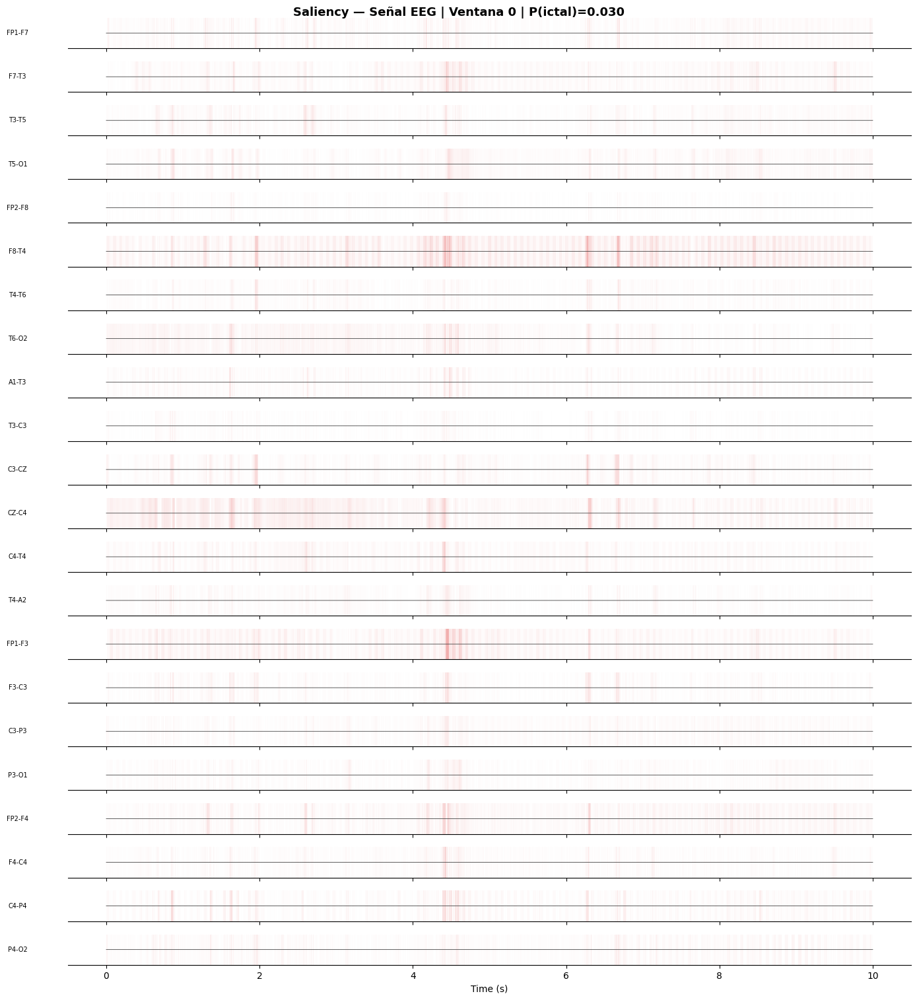

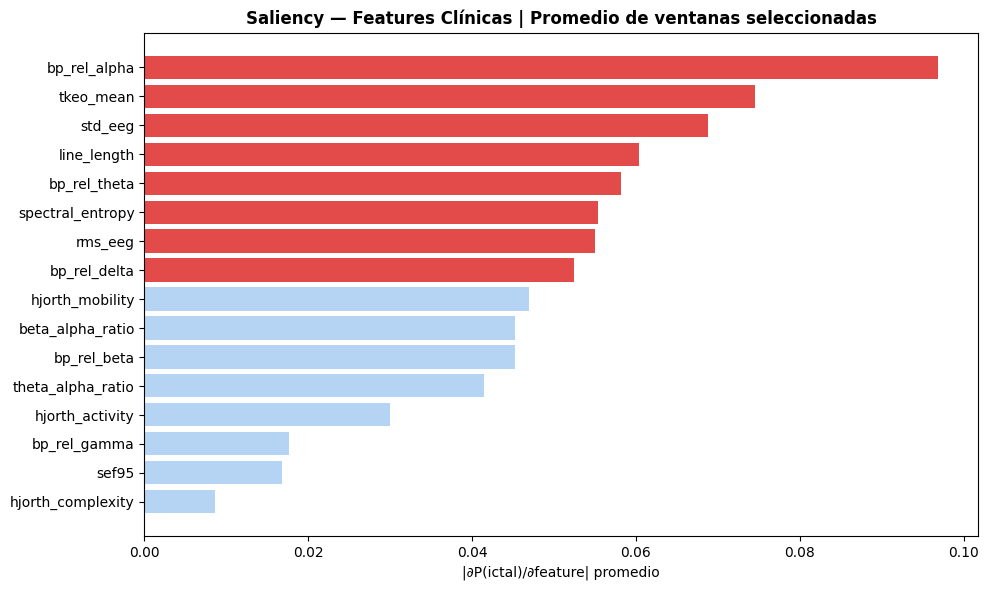

In [113]:
# ── Saliency: señal EEG (ventana 0) ──────────────────────────────────────────
# saliency_signal[0]: toma la primera ventana del batch → shape (2560, 22)
# X_sel[0].cpu().numpy(): señal cruda correspondiente → shape (2560, 22)
plot_saliency_signal(
    saliency_signal[0],
    X_sel[0].cpu().numpy(),
    CHANNEL_NAMES,
    title=f'Saliency — Señal EEG | Ventana 0 | P(ictal)={baseline_probs[0]:.3f}',
    save_path=f'{SAVE_DIR}/saliency_signal_v0.png'
)

# ── Saliency: features clínicas (promedio de todas las ventanas) ──────────────
plot_saliency_features(
    saliency_features,
    FEATURE_NAMES,
    title='Saliency — Features Clínicas | Promedio de ventanas seleccionadas',
    save_path=f'{SAVE_DIR}/saliency_features.png'
)